In [2]:
import numpy as np
import pandas as pd
import cv2
import cv2 as cv

import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage as ndi

%matplotlib inline


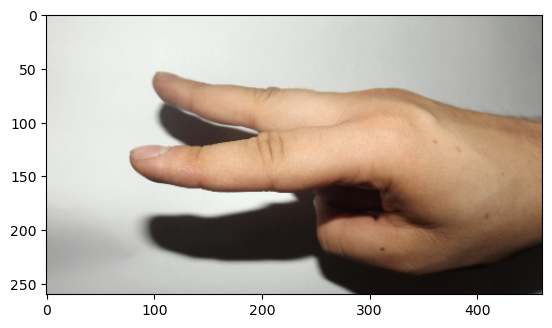

In [3]:
def plt_t(title, img, cmap=None):
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.show()

# Pre-processing of the images is done
def segm_1(img_rgb):
  img_ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2YCR_CB)  
  ycrcbmin = np.array((0, 133, 77))
  ycrcbmax = np.array((255, 173, 127))
  skin_ycrcb = cv2.inRange(img_ycrcb, ycrcbmin, ycrcbmax)
  kernel = np.ones((5, 5), np.uint8)
  img_erode = cv2.erode(skin_ycrcb, kernel, iterations=2)  
  holesimg = ndi.binary_fill_holes(img_erode).astype(np.int) 
  return holesimg


nemo = cv2.imread(r'dataset\men\2\2_men (12).JPG')  # read in BGR format
nemo = cv2.cvtColor(nemo, cv2.COLOR_BGR2RGB)
nemo = cv2.resize(nemo, (461, 260))
plt.imshow(nemo)
plt.show()

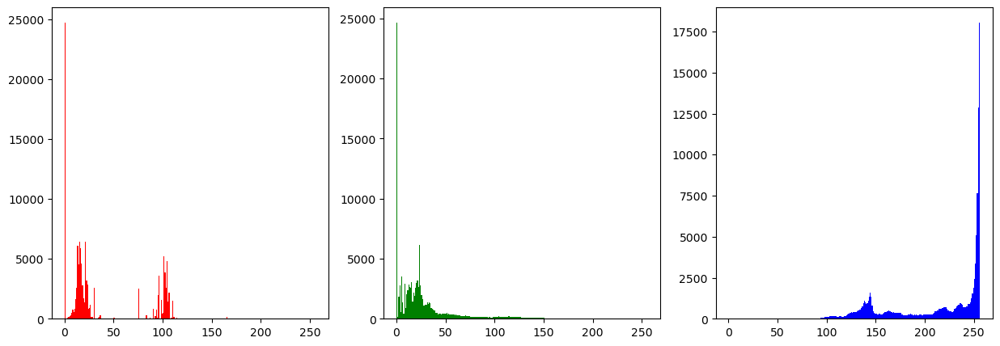

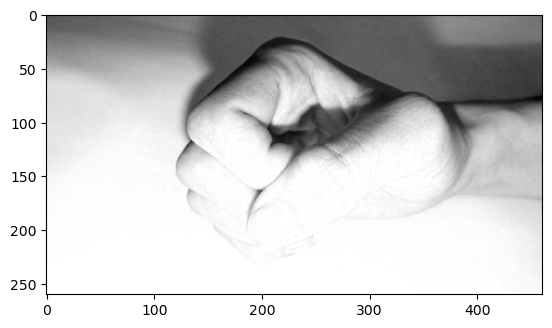

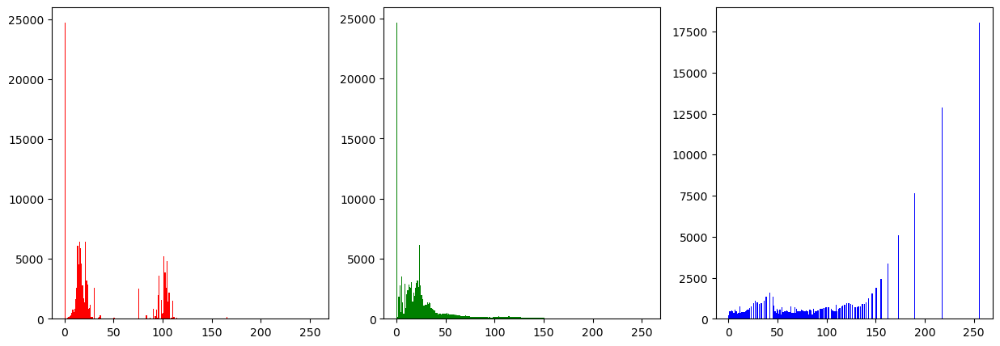

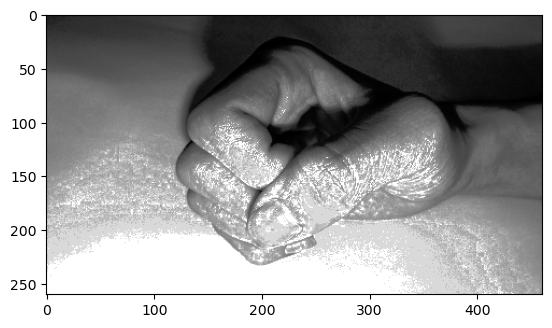

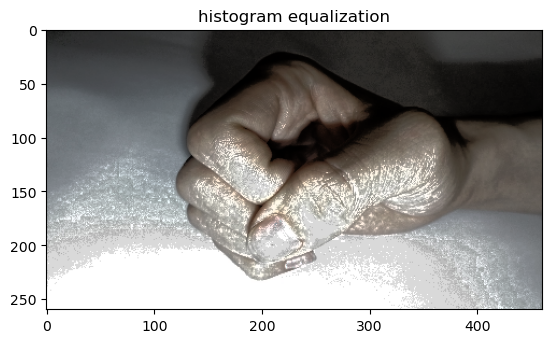

In [4]:
# histogram equalization
p6 = r"dataset\men\0\0_men (118).JPG"
nemo = cv2.imread(p6)  # read in BGR format
nemo = cv2.cvtColor(nemo, cv2.COLOR_BGR2HSV)
nemo = cv2.resize(nemo, (461, 260))
r, g, b = cv2.split(nemo)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
# draw histogram for each channel
ax[0].hist(r.ravel(), bins=256, range=[0, 256], color='r')
ax[1].hist(g.ravel(), bins=256, range=[0, 256], color='g')
ax[2].hist(b.ravel(), bins=256, range=[0, 256], color='b')
plt.show()
plt_t('', b, cmap='gray')

# r = cv2.equalizeHist(r)
# g = cv2.equalizeHist(g)
b = cv2.equalizeHist(b)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
# draw histogram for each channel
ax[0].hist(r.ravel(), bins=256, range=[0, 256], color='r')
ax[1].hist(g.ravel(), bins=256, range=[0, 256], color='g')
ax[2].hist(b.ravel(), bins=256, range=[0, 256], color='b')
plt.show()
plt_t('', b, cmap='gray')

nemo = cv2.merge((r, g, b))
nemo = cv2.cvtColor(nemo, cv2.COLOR_HSV2RGB)
plt_t('histogram equalization', nemo)

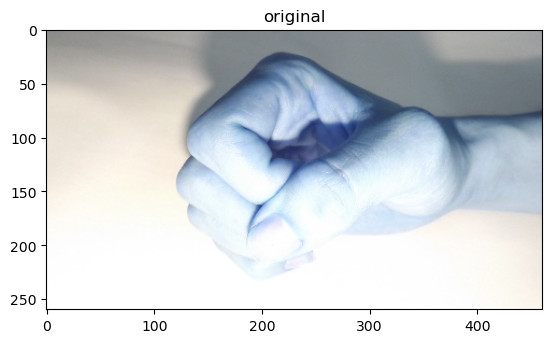

[239.]


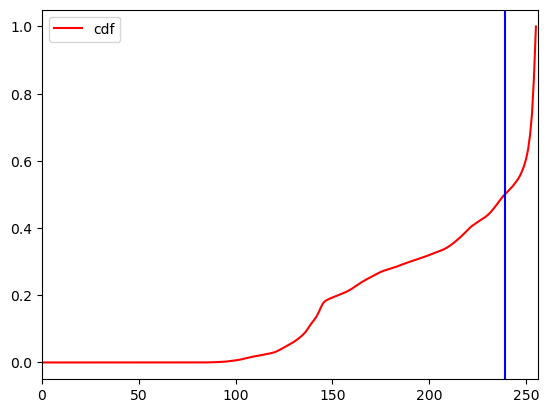

True
False
True


In [50]:
img = cv2.imread(p6)  # read in BGR format
img = cv2.resize(img, (461, 260))
plt_t('original', img)
# find histogram od value channel and draw a cumulative distribution function
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)
hist, bins = np.histogram(v.ravel(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf / cdf.max()
plt.plot(cdf_normalized, color='r')
plt.legend(('cdf', 'histogram'), loc='upper left')
# find quantiles and draw vertical lines
quantiles = np.quantile(v, [0.5])
print(quantiles)
for q in quantiles:
    plt.axvline(q, color='b')
# mean_point = np.mean(v)
# print(mean_point)
# plt.axvline(mean_point, color='b')
plt.xlim([0, 256])
plt.show()

def is_lightened(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    _, _, v = cv2.split(hsv)
    quantiles = np.quantile(v, [0.5])
    # print(quantiles)
    return quantiles[0] > 220
img1 = cv2.imread(p6)  # read in BGR format
img1 = cv2.resize(img1, (461, 260))
print(is_lightened(img1))

img1 = cv2.imread(p5)  # read in BGR format
img1 = cv2.resize(img1, (461, 260))
print(is_lightened(img1))


img1 = cv2.imread(p7)  # read in BGR format
img1 = cv2.resize(img1, (461, 260))
print(is_lightened(img1))

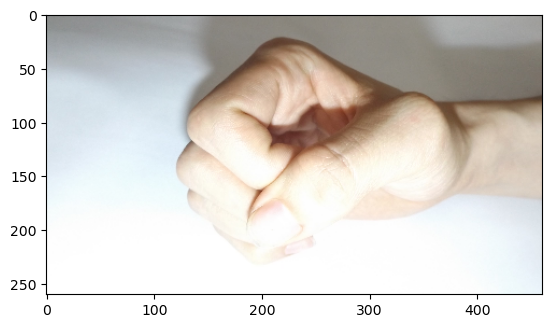

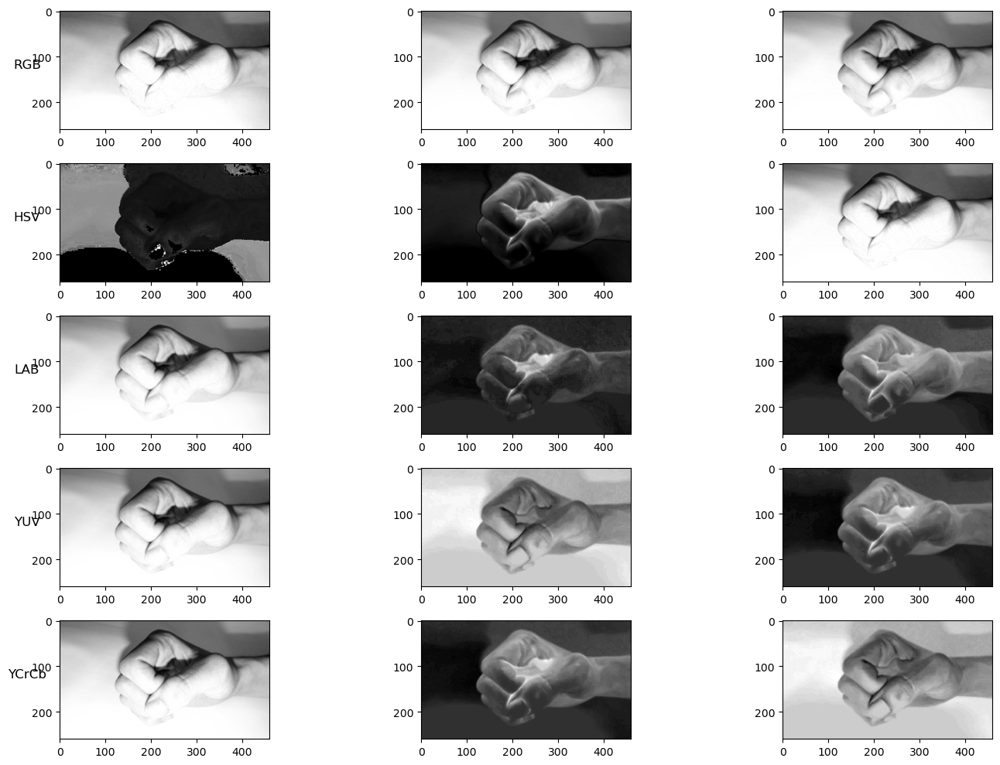

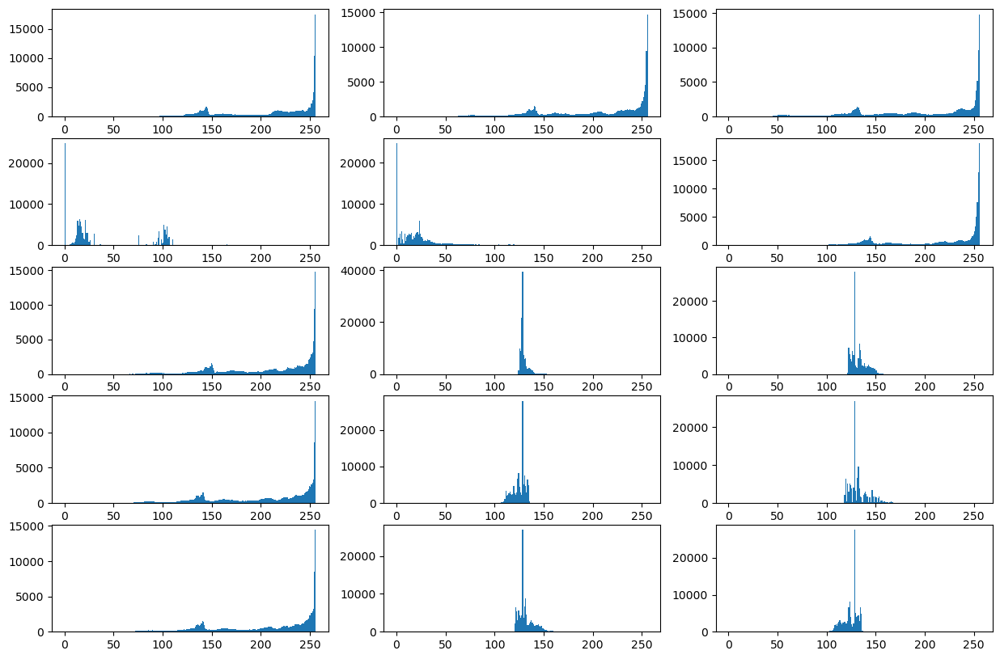

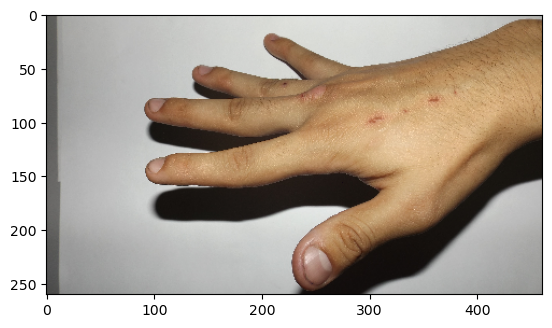

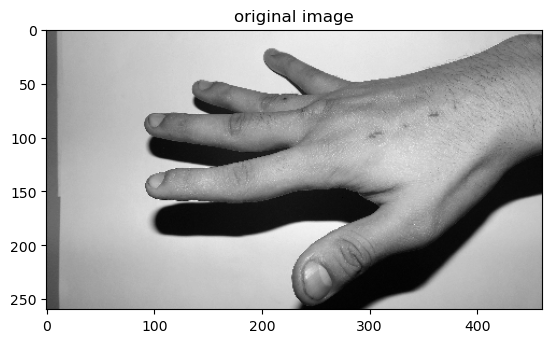

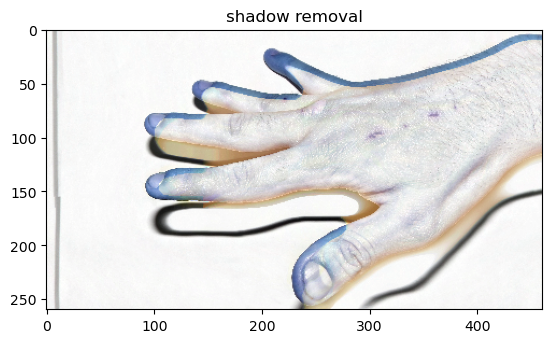

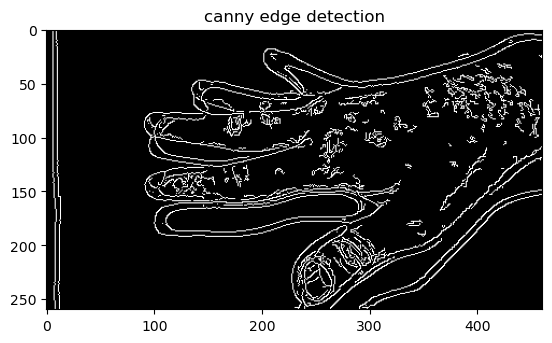

In [14]:
# Read image and Draw all thhe channels in different colors
# RGB, HSV, LAB, YUV, YCrCb with OpenCV
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"

path = p6
img = cv2.imread(path)
img = cv2.resize(img, (461, 260))
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img2)
plt.show()

channels = [cv2.COLOR_BGR2RGB, cv2.COLOR_BGR2HSV,
            cv2.COLOR_BGR2LAB, cv2.COLOR_BGR2YUV, cv2.COLOR_BGR2YCrCb]
names = ['RGB', 'HSV', 'LAB', 'YUV', 'YCrCb']
# # subplots
fig, ax = plt.subplots(5, 3, figsize=(15, 10))
fig2, ax2 = plt.subplots(5, 3, figsize=(15, 10))
sigmas = []
for i in range(5):
    imag = cv2.cvtColor(img, channels[i])
    a, b, c = cv2.split(imag)
    ax[i, 0].imshow(a, cmap='gray')
    ax[i, 1].imshow(b, cmap='gray')
    ax[i, 2].imshow(c, cmap='gray')
    # draw histograms for each channel
    ax2[i, 0].hist(a.ravel(), 256, [0, 256])
    ax2[i, 1].hist(b.ravel(), 256, [0, 256])
    ax2[i, 2].hist(c.ravel(), 256, [0, 256])

# title for each row
for ax, row in zip(ax[:, 0], names):
    ax.set_ylabel(row, rotation=0, size='large')

fig.tight_layout()
plt.show()


def shadow_remove(img):
    rgb_planes = cv2.split(img)
    result_norm_planes = []
    for plane in rgb_planes:
        dilated_img = cv2.dilate(plane, np.ones((10, 10), np.uint8))
        bg_img = cv2.medianBlur(dilated_img, 21)
        diff_img = 255 - cv2.absdiff(plane, bg_img)
        norm_img = cv2.normalize(
            diff_img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
        result_norm_planes.append(norm_img)
    shadowremov = cv2.merge(result_norm_planes)
    return shadowremov


# Shadow removal
path = p5
img = cv2.imread(path)
img = cv2.resize(img, (461, 260))
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img2)
plt.show()
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt_t('original image', img2, cmap='gray')

img = cv2.imread(path)
img = cv2.resize(img, (461, 260))
shad = shadow_remove(img)
sum = cv2.addWeighted(img, 0.4, shad, 0.5, 0)
plt_t('shadow removal', shad)

# apply cannny edge detection
edges = cv2.Canny(shad, 70, 170)
plt_t('canny edge detection', edges, cmap='gray')

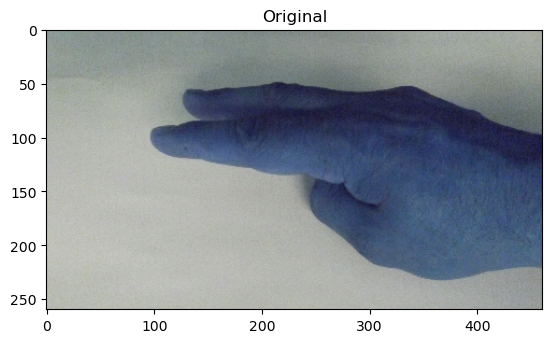

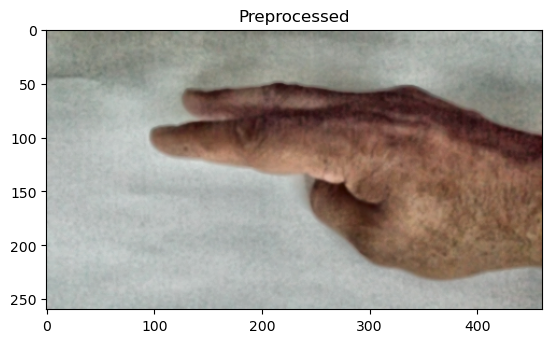

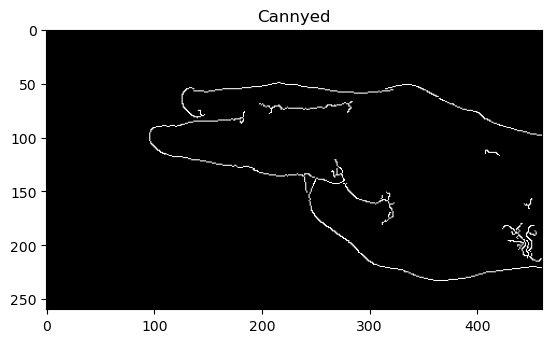

0.15490041411950303


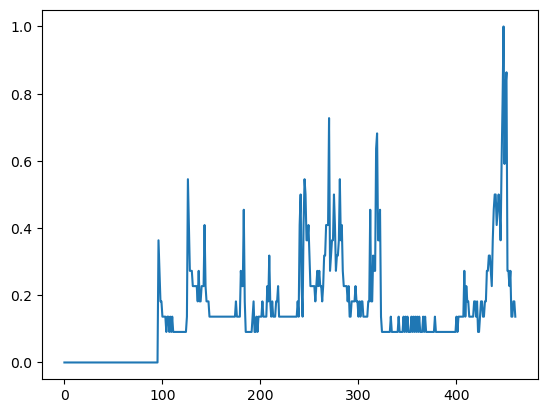

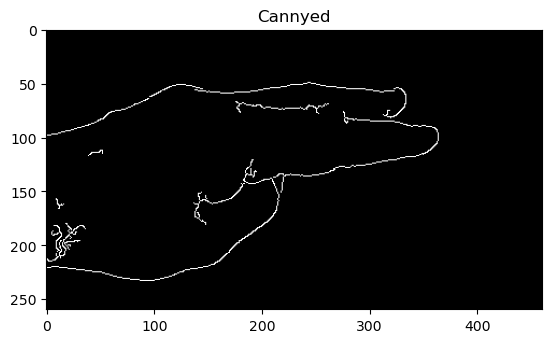

In [6]:
import cv2
import numpy as np

# Read image
p9 = r'dataset/men/1/1_men (113).JPG'
p9 = r'dataset/men/0/0_men (165).JPG'
p9 = r'dataset/men/2/2_men (1).JPG'
img = cv2.imread(p9)
img = cv2.resize(img, (461, 260))


# Apply Gaussian blur to reduce image noise
blur = cv2.GaussianBlur(img, (5, 5), 0)

# Apply adaptive thresholding to separate foreground from background
# thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
# plt_t('adaptive thresholding', thresh, cmap='gray')
# Apply morphological opening to remove small imperfections in the foreground





# opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
# Convert image to LAB color space
kernel = np.ones((3, 3), np.uint8)
lab = cv2.cvtColor(blur, cv2.COLOR_BGR2LAB)

# Apply CLAHE to enhance contrast in LAB lightness channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
lab[:, :, 0] = clahe.apply(lab[:, :, 0])

# Convert image back to BGR color space
bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

canny = cv2.Canny(bgr, 50, 200)

# Display original and preprocessed images side by side
plt_t("Original", img)
plt_t("Preprocessed", bgr)
plt_t("Cannyed", canny, cmap='gray')

# histogram of #pixels on colums of cannyed image
a = canny.sum(axis=0)
# noramlize
a = a / a.max()
# which half of the image has more pixels
plt.plot(a)

    
# plot
print(a.mean())
if(a[:int(len(a)//4)].mean() < a[int(len(a)*3//4):].mean()):
    # flip the image
    canny = cv2.flip(canny, 1)



plt.show()
plt_t("Cannyed", canny, cmap='gray')
plt.show()

C:\Users\aatta\AppData\Local\Temp\ipykernel_24416\680662840.py:14: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  holesimg = ndi.binary_fill_holes(img_erode).astype(np.int)


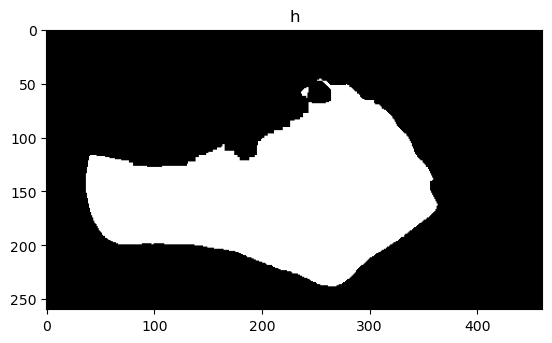

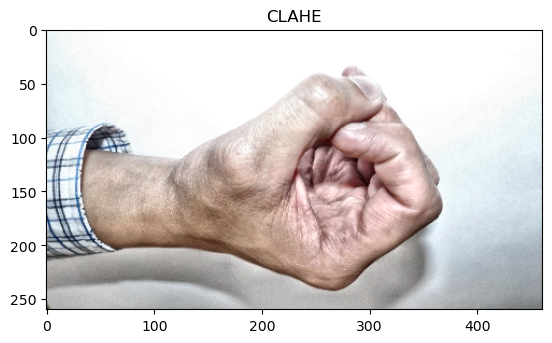

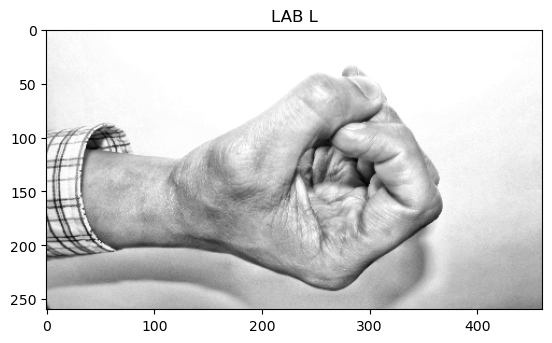

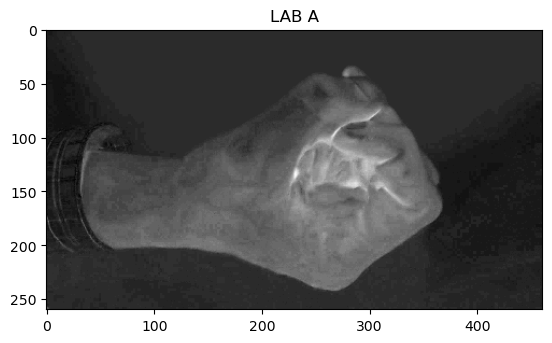

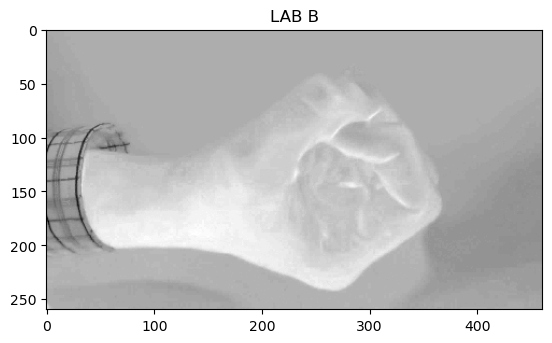

...

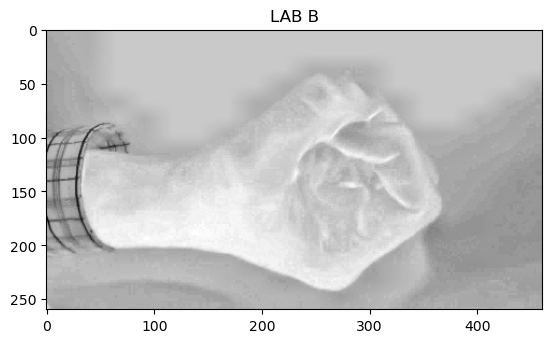

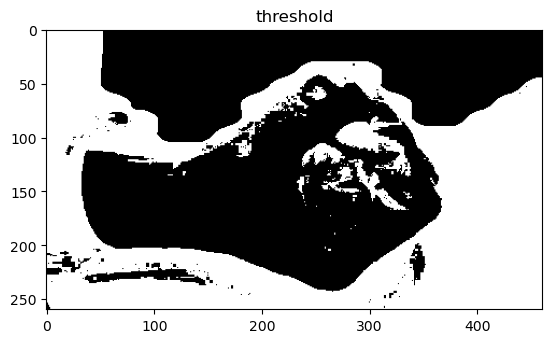

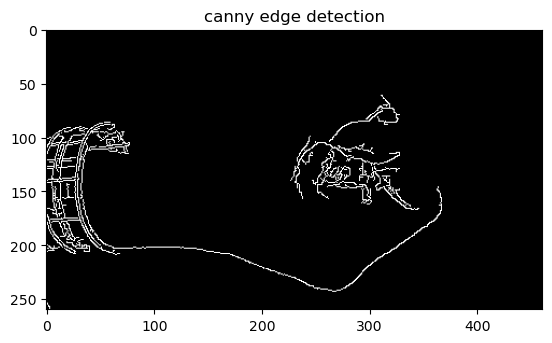

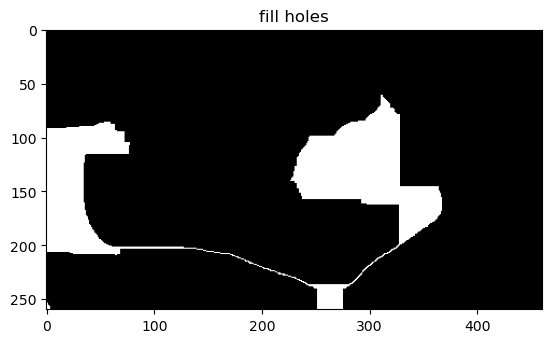

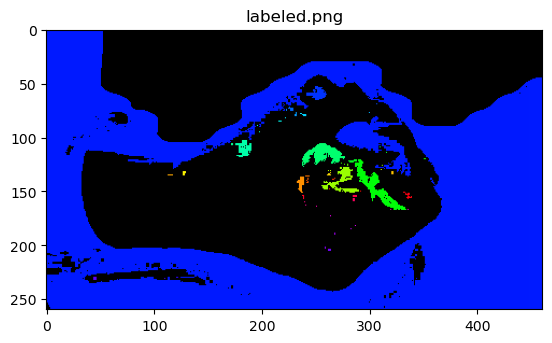

In [7]:

# convert image to the LAB color space and threshold on the B channel

# 0_men (67).JPG
p8 = r'dataset/men/0/0_men (67).JPG'
img = cv2.imread(p8)
img = cv2.resize(img, (461, 260))

h = segm_1(img)
plt_t('h', h, cmap='gray')

# thresh = cv2.threshold(r, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
# plt_t('threshold', thresh, cmap='gray')

# decrease the brightness of the image 
# the more the brightness the more it's decrease
# Convert image to LAB color space
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Apply CLAHE to enhance contrast in LAB lightness channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(18,18))
lab[:, :, 0] = clahe.apply(lab[:, :, 0])

# Convert image back to BGR color space
bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
plt_t('CLAHE', bgr)

b, g, r = cv2.split(lab)
plt_t('LAB L', b, cmap='gray')
plt_t('LAB A', g, cmap='gray')
plt_t('LAB B', r, cmap='gray')

# normalize the image
r = cv2.normalize(r, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
# r = cv2.equalizeHist(r)
# r = cv2.medianBlur(r, 5)
r = clahe.apply(r)

# histogram of r channel
plt.hist(r.ravel(), bins=256, range=[0, 255], color='r')
plt.show()

# sobel edge detection
from skimage.filters import sobel

elevation_map = sobel(r)

plt_t('sobel', elevation_map, cmap='gray')


markers = np.zeros_like(r)
markers[r < 30] = 1
markers[r > 150] = 2
from skimage import segmentation

segmentation_coins = segmentation.watershed(elevation_map, markers)

plt_t('segmentation', segmentation_coins, cmap='gray')
# canny on LAB B
plt_t('LAB B', r, cmap='gray')
thresh = cv2.threshold(r, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
plt_t('threshold', thresh, cmap='gray')
edges = cv2.Canny(r, 30, 200)
plt_t('canny edge detection', edges, cmap='gray')

# close 
kernel = np.ones((19, 19), np.uint8)
closing = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=2)
fill_coins = ndi.binary_fill_holes(closing)
plt_t('fill holes', fill_coins, cmap='gray')

# plt_t('magic',cv2.cvtColor(b, cv2.COLOR_GRAY2RGB))
_, labels = cv2.connectedComponents(thresh)

# Map component labels to hue val
label_hue = np.uint8(179*labels/np.max(labels))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
labeled_img[label_hue==0] = 0

plt_t('labeled.png', labeled_img)

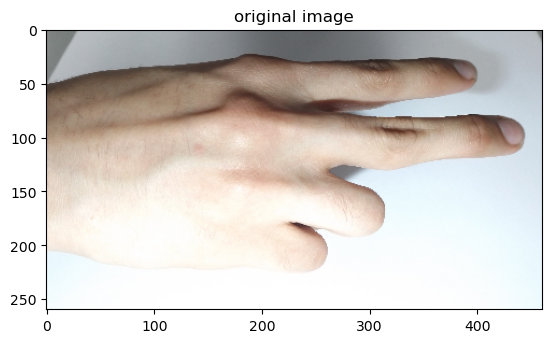

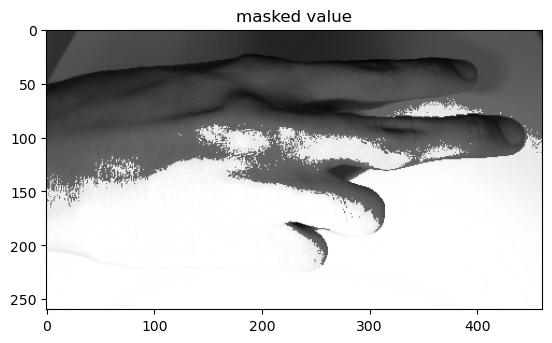

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


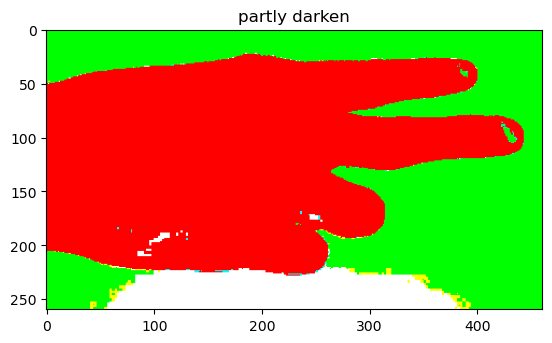

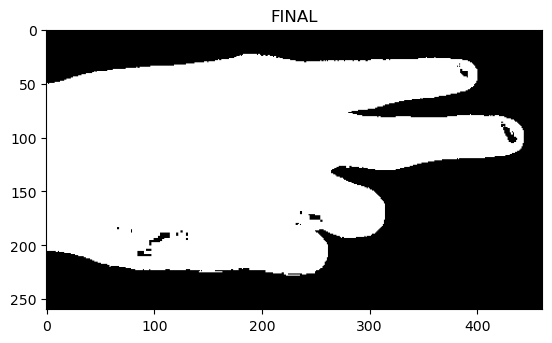

In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import k_means
# https://answers.opencv.org/question/179998/how-to-remove-these-small-glare-from-the-image/


img = cv2.imread(p7)
img = cv2.resize(img, (461, 260))
plt_t('original image', cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
def segm_5(img):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    mk = img_hsv > np.array([0, 0, 230])
    mk = mk.astype(np.float32)
    mask = (mk *0.5 + 0.5)
    masked = (mask* img_hsv)
    plt_t('masked value',masked[:,:,2],cmap='gray')
    img_partly_darken = cv2.cvtColor(masked, cv2.COLOR_HSV2RGB)
    # normalize image
    # cv2.normalize(img_partly_darken, img_partly_darken, 0, 1.0, cv2.NORM_MINMAX)
    plt_t("partly darken", img_partly_darken)
    green_mask = (img_partly_darken[:, :, 0] > img_partly_darken[:, :, 1]).astype(np.float32)
    plt_t('FINAL', green_mask, cmap='gray')



segm_5(img)


# cv2.imwrite("t.png", img_partly_darken)
# # Save the img now, and ... Surprise! You can feel the mystery:
# plt.imshow(cv2.cvtColor(cv2.imread("t.png"), cv2.COLOR_BGR2RGB))
# plt.show()

# Then, you can just pick out the green ones:
# value of green channel > that of red channel
# green_mask = img[:, :, 1] > img[:, :, 2]
# # Here is a trick, I use color space convertion to boardcast one channel to three channels
# green_mask = (green_mask.astype(np.uint8)) * 255
# green_mask = cv2.cvtColor(green_mask, cv2.COLOR_GRAY2BGR)
# green3_mask = (green_mask > 0).astype(np.uint8) * 255
# img_green = cv2.bitwise_and(green3_mask, img)
# plt_t('img_green', cv2.cvtColor(img_green, cv2.COLOR_BGR2RGB))

# # Back to the original img's colors:
# ret, thr = cv2.threshold(cv2.cvtColor(
#     img_green, cv2.COLOR_BGR2GRAY), 10, 255, cv2.THRESH_BINARY)
# blue_mask = (cv2.cvtColor(thr, cv2.COLOR_GRAY2BGR) > 0).astype(np.uint8) * 255
# kernel_open = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
# blue_mask = cv2.morphologyEx(blue_mask, cv2.MORPH_OPEN, kernel_open)
# yellow_mask = 255 - blue_mask

# # use k-means to get the two main colors -- blue and yellow
# pixels = img
# pixels = pixels.reshape(pixels.shape[0] * pixels.shape[1], 3)
# [centroids, labels, inertia] = k_means(pixels, 2)
# centroids = np.array(sorted(centroids.astype(
#     np.uint8).tolist(), key=lambda x: x[0]))       # B channel
# blue_centroid = centroids[1]
# yellow_centroid = centroids[0]
# blue_ones = cv2.bitwise_and(blue_mask, centroids[1])
# yellow_ones = cv2.bitwise_and(yellow_mask, centroids[0])
# plt.imshow(cv2.cvtColor(cv2.add(blue_ones, yellow_ones), cv2.COLOR_BGR2RGB))
# plt.show()

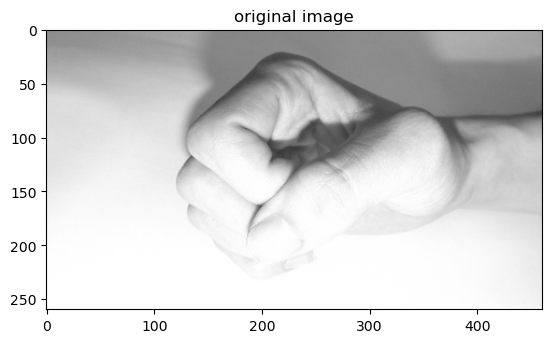

I count 1 coins in this image


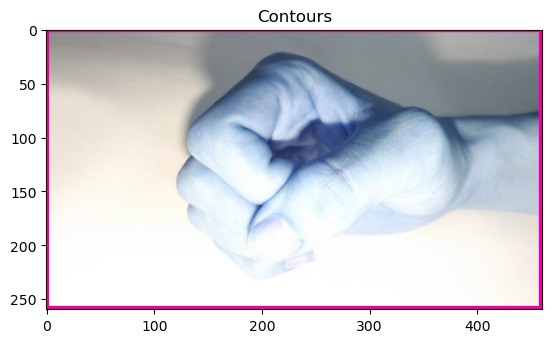

In [9]:
# Convert the image to grayscale

image = cv2.imread(p6)
image = cv2.resize(image, (461, 260))
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.uint8)
plt_t('original image', cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))
# Compute the median pixel value for each color channe

# find contours in the thresholded image and draw them on the original image
cnts ,_= cv2.findContours(gray.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# cnts = imutils.grab_contours(cnts)
# sort the contours with size 
cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
print("I count {} coins in this image".format(len(cnts)))
output = image.copy()
# loop over the contours
for c in cnts[0:5]:
    # draw the contour and show it
    cv2.drawContours(output, [c], -1, (240, 0, 159), 3)
    plt_t("Contours", output)
    


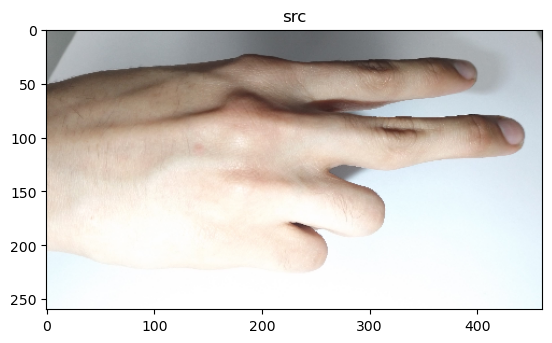

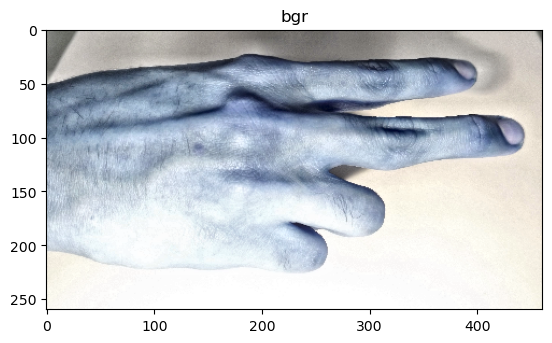

C:\Users\aatta\AppData\Local\Temp\ipykernel_24416\162550182.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  holesimg = ndi.binary_fill_holes(img_erode).astype(np.int)


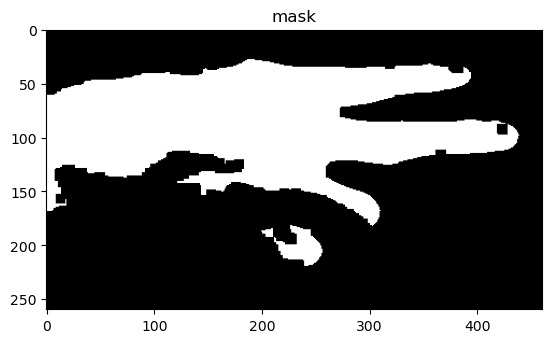

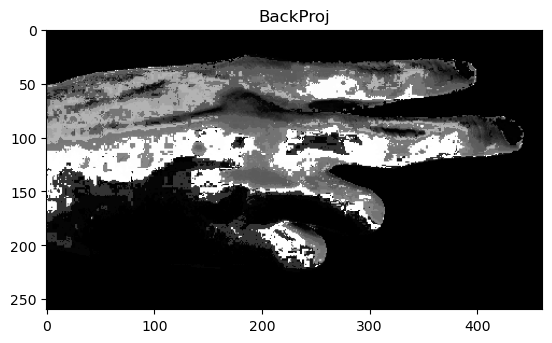

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [10]:
def Hist_and_Backproj(mask):
    h_bins = 30
    s_bins = 32
    histSize = [h_bins, s_bins]
    h_range = [0, 180]
    s_range = [0, 256]
    ranges = h_range + s_range  # Concat list
    channels = [0, 1]

    # Get the Histogram and normalize it
    hist = cv.calcHist([hsv], channels, mask, histSize, ranges, accumulate=False)
    cv.normalize(hist, hist, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)

    # Get Backprojection
    backproj = cv.calcBackProject([hsv], channels, hist, ranges, scale=1)

    # Draw the backproj
    plt_t('BackProj', backproj, cmap='gray')
    
    return backproj
def segm_1(img_rgb):
  img_ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2YCR_CB)  
  ycrcbmin = np.array((0, 135, 85))
  ycrcbmax = np.array((255, 180, 135))
  skin_ycrcb = cv2.inRange(img_ycrcb, ycrcbmin, ycrcbmax)
  kernel = np.ones((5, 5), np.uint8)
  img_erode = cv2.erode(skin_ycrcb, kernel, iterations=2)  
  holesimg = ndi.binary_fill_holes(img_erode).astype(np.int) 
  return holesimg


src = cv.imread(p7)
src = cv.resize(src, (461, 260))
plt_t('src', cv.cvtColor(src, cv.COLOR_BGR2RGB))
hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV)




lab = cv2.cvtColor(src, cv2.COLOR_BGR2LAB)

# Apply CLAHE to enhance contrast in LAB lightness channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(18,18))
lab[:, :, 0] = clahe.apply(lab[:, :, 0])

# Convert image back to BGR color space
bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
plt_t('bgr', bgr)
hsv = cv.cvtColor(src, cv.COLOR_RGB2HSV)
mask = segm_1(bgr).astype(np.uint8)
plt_t('mask', mask, cmap='gray')
Hist_and_Backproj(mask)

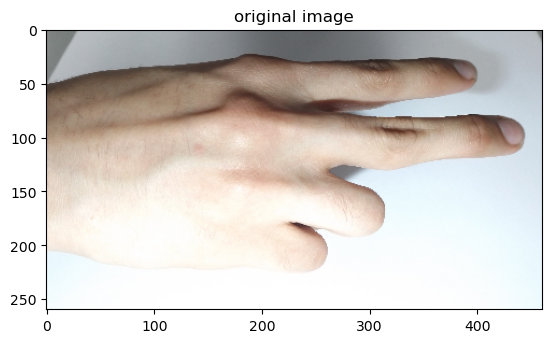

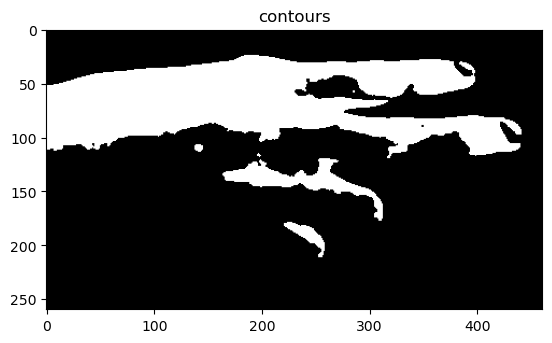

In [11]:
def imageFiltering(frame):

	#area of intereset(hand)

	#applying gaussian blurr to reduce the noise
	blur = cv2.GaussianBlur(frame,(5,5),0)
	#converting from coloured to HSV
	hsv = cv2.cvtColor(blur,cv2.COLOR_BGR2HSV)

	#applying a mask which makes skin color white and others black
	mask = cv2.inRange(hsv,np.array([2,50,50]),np.array([20,255,255]))

	kernel = np.ones((5,5))
	#reducing noise
	filtered = cv2.GaussianBlur(mask,(3,3),0)
	ret,thresh = cv2.threshold(filtered,127,255,0) #thesholding the image
	thesh = cv2.GaussianBlur(thresh,(5,5),0) #reducing the noise
	#finding contours in the image. Will be used later in complex hull algorithm
	contours,hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
	return thresh,contours

img = cv2.imread(p7)
img = cv2.resize(img, (461, 260))
plt_t('original image', cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

ret ,cont = imageFiltering(img)
plt_t('contours',ret,cmap='gray')


In [12]:
import cv2
import numpy as np

img = cv2.imread(p5)
img = cv2.imread(r'dataset\men\0\0_men (10).JPG')
img = cv2.resize(img, (461, 260))
def segm101(img):
    # Convert image to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    # Apply CLAHE to enhance contrast in LAB lightness channel
    clahe = cv2.createCLAHE(clipLimit=10.0, tileGridSize=(18,18))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])

    # Convert image back to BGR color space
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    # Display original and preprocessed images side by side
    plt_t("Original", cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t("Preprocessed",  cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
    # apply cannny edge detection
    edges = cv2.Canny(bgr, 100, 200)
    plt_t('canny edge detection', edges, cmap='gray')
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (1, 8))
    opening = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=1)
    plt_t('canny edge detection', opening, cmap='gray')
    from skimage import morphology
    holesimg = ndi.binary_fill_holes(opening).astype(np.int8)
    bin = holesimg>0.5
    a = morphology.remove_small_objects(bin, 1000)
    return a

plt_t('holes',holesimg,cmap='gray')
plt_t('small parts detection', a, cmap='gray')






NameError: name 'holesimg' is not defined

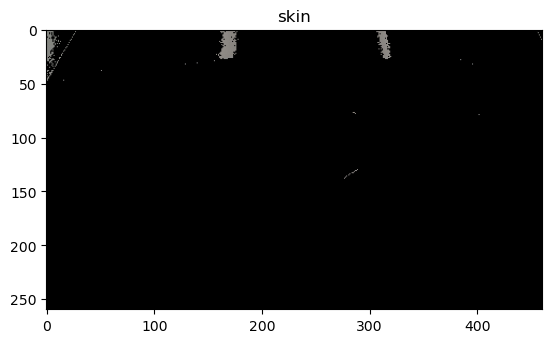

In [ ]:
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"

img = cv2.imread(p7)
img = cv2.resize(img, (461, 260))

import cv2
import numpy as np

def backgroundSubtraction(imgYCRCB, bgYCRCB, thresh):
    img = bgYCRCB - imgYCRCB
    frameChannels = cv2.split(img)
    element = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for i in range(3):
        _, frameChannels[i] = cv2.threshold(frameChannels[i], thresh, 255, cv2.THRESH_BINARY)
        frameChannels[i] = cv2.morphologyEx(frameChannels[i], cv2.MORPH_OPEN, element, iterations=3)
    merged = cv2.merge(frameChannels)
    _, merged = cv2.threshold(merged, thresh, 255, cv2.THRESH_BINARY)
    merged = cv2.morphologyEx(merged, cv2.MORPH_OPEN, element, iterations=3)
    merged = cv2.bitwise_and(merged, imgYCRCB)
    return merged

def faceDetection(original):
    image = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    image = cv2.equalizeHist(image)
    faceCascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(image)
    return faces

def faceRemoval(img, original):
    faces = faceDetection(original)
    for (x,y,w,h) in faces:
        cv2.rectangle(img, (x,y), (x+w,y+h), (0,0,0), -1)
    return img

def skinExtraction(original, img):
    min_YCrCb = np.array([54, 131, 110], np.uint8)
    max_YCrCb = np.array([163, 157, 135], np.uint8)
    skinRegion = cv2.inRange(original, min_YCrCb, max_YCrCb)
    skinRegion = cv2.bitwise_and(img, img, mask=skinRegion)
    return skinRegion

def preprocess(original, morph_size, background, lowThreshold):
    bgYCRCB = cv2.cvtColor(background, cv2.COLOR_BGR2YCrCb)
    frame = original.copy()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2YCrCb)
    bgRemoved = backgroundSubtraction(frame, bgYCRCB, 15)
    output = faceRemoval(bgRemoved, original)
    output = cv2.GaussianBlur(output, (7,7), 1.8, 1.8)
    detect_Edges = cv2.Canny(output, lowThreshold, lowThreshold*3)
    detect_Edges = cv2.dilate(detect_Edges, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)))
    detect_Edges = cv2.cvtColor(detect_Edges, cv2.COLOR_GRAY2BGR)
    detect_Edges = cv2.cvtColor(detect_Edges, cv2.COLOR_BGR2YCrCb)
    output = output + detect_Edges
    output = cv2.cvtColor(output, cv2.COLOR_YCrCb2BGR)
    output = cv2.cvtColor(output, cv2.COLOR_BGR2GRAY)
    output = skinExtraction(frame, output)
    _, output = cv2.threshold(output, morph_size, 255, cv2.THRESH_BINARY)
    
    element = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    output = cv2.morphologyEx(output, cv2.MORPH_OPEN, element, iterations=3)
    
    
    output = cv2.GaussianBlur(output, (7, 7), 1.8)
    thresh4 = cv2.threshold(output, 100, 255, cv2.THRESH_BINARY)[1]

    return thresh4

img = cv2.imread(p7)
img = cv2.resize(img, (461, 260))
ouy = skinExtraction(img, img)
plt_t('skin', ouy, cmap='gray')
    

C:\Users\aatta\AppData\Local\Temp\ipykernel_31096\4280809435.py:13: FutureWarning: `max_iter` is a deprecated argument name for `chan_vese`. It will be removed in version 1.0. Please use `max_num_iter` instead.
  chanvese_gray_astronaut = chan_vese(gray_astronaut,


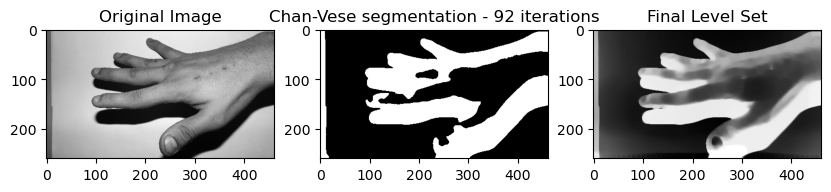

In [ ]:

import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage import data, img_as_float
from skimage.segmentation import chan_vese
fig, axes = plt.subplots(1, 3, figsize=(10, 10))

# Sample Image of scikit-image package
astronaut = cv2.imread(path)
astronaut = cv2.resize(astronaut, (461, 260))
gray_astronaut = rgb2gray(astronaut)

# Computing the Chan VESE segmentation technique
chanvese_gray_astronaut = chan_vese(gray_astronaut,
                                    max_iter=100,
                                    extended_output=True)

ax = axes.flatten()

# Plotting the original image
ax[0].imshow(gray_astronaut, cmap="gray")
ax[0].set_title("Original Image")

# Plotting the segmented - 100 iterations image
ax[1].imshow(chanvese_gray_astronaut[0], cmap="gray")
title = "Chan-Vese segmentation - {} iterations".\
    format(len(chanvese_gray_astronaut[2]))

ax[1].set_title(title)

# Plotting the final level set
ax[2].imshow(chanvese_gray_astronaut[1], cmap="gray")
ax[2].set_title("Final Level Set")
plt.show()

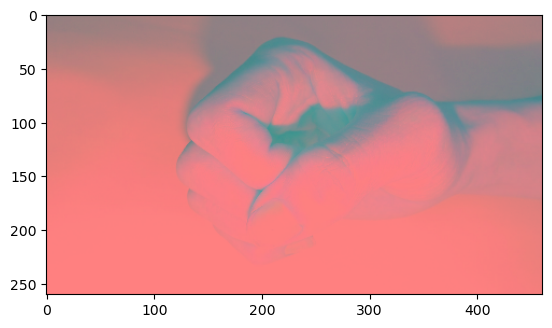

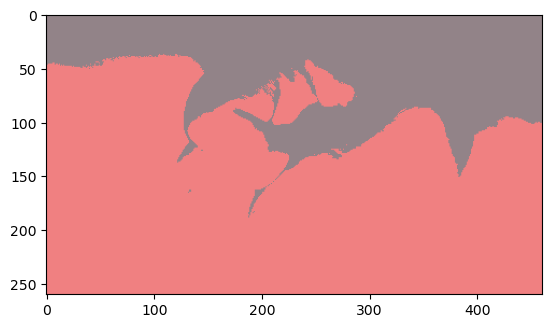

In [ ]:
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"

path = p6
img = cv2.imread(path)
img = cv2.resize(img, (461, 260))
img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
plt.imshow(img)
plt.show()

# the below line of code defines the criteria for the algorithm to stop running,
# which will happen is 100 iterations are run or the epsilon (which is the required accuracy)
# becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.95)

# then perform k-means clustering with number of clusters defined as 3
# also random centres are initially choosed for k-means clustering
k = 2
pixel_values = img.reshape((-1, 3))
pixel_values = np.float32(pixel_values)
retval, labels, centers = cv2.kmeans(
    pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]

# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((img.shape))

plt.imshow(segmented_image)

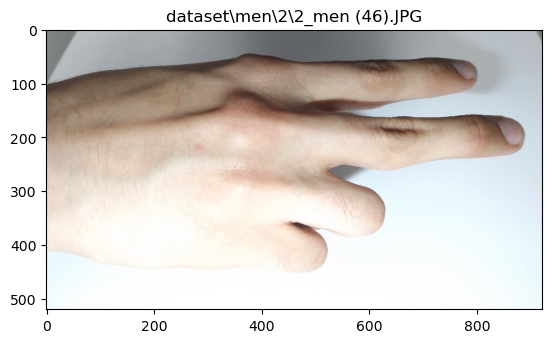

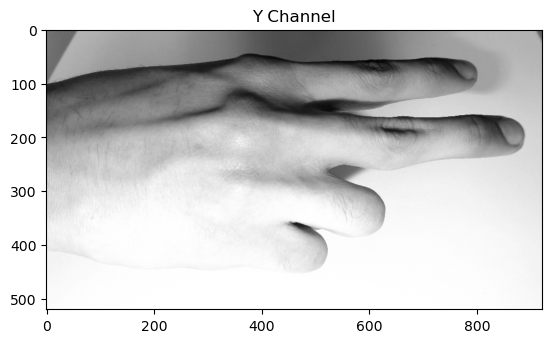

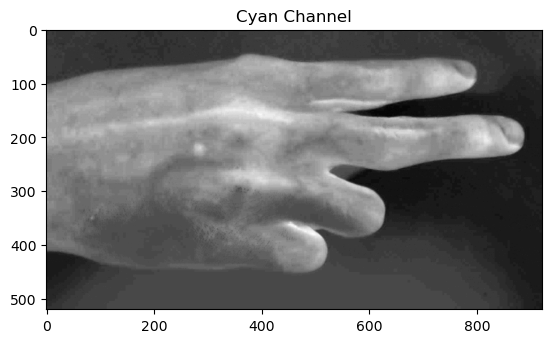

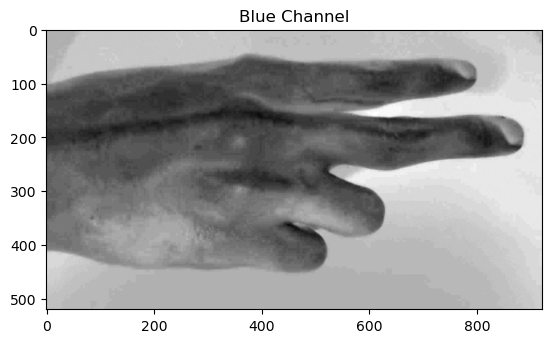

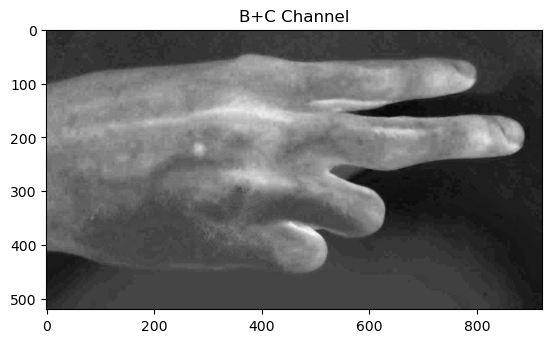

156 117


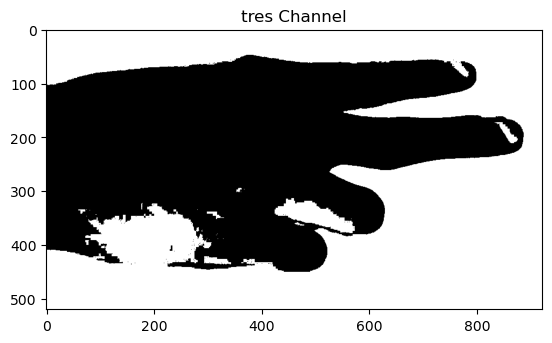

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

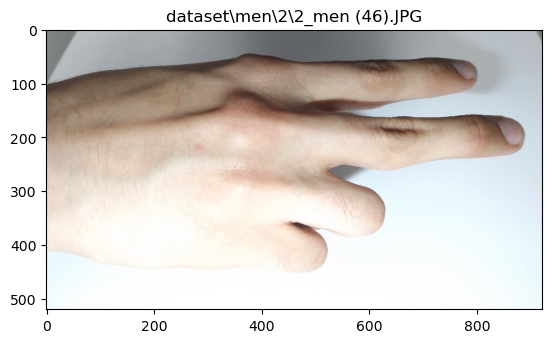

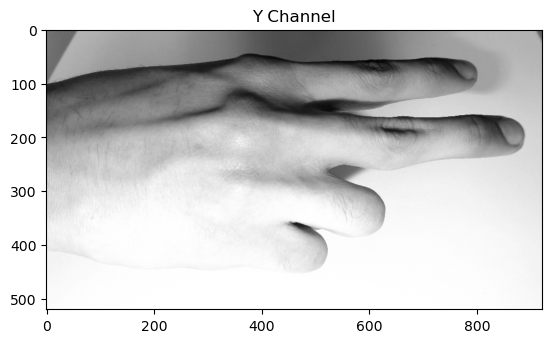

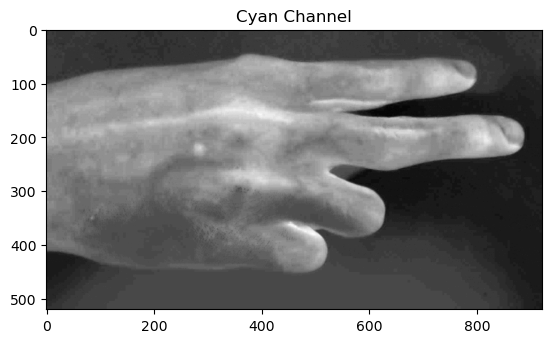

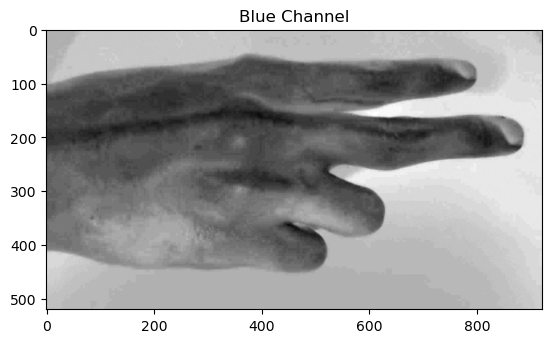

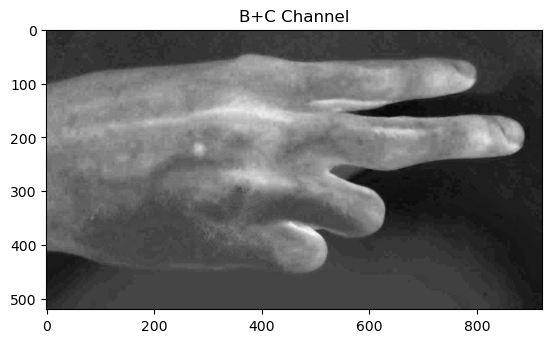

156 117


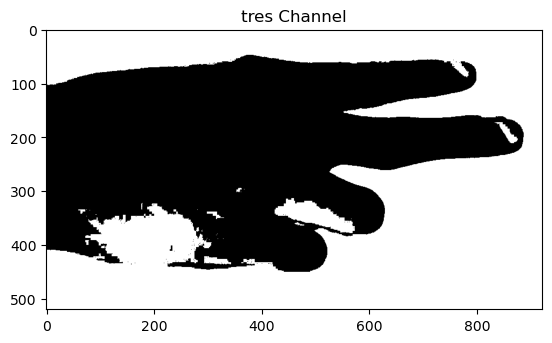

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')
    # fill gaps in image
    
        


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

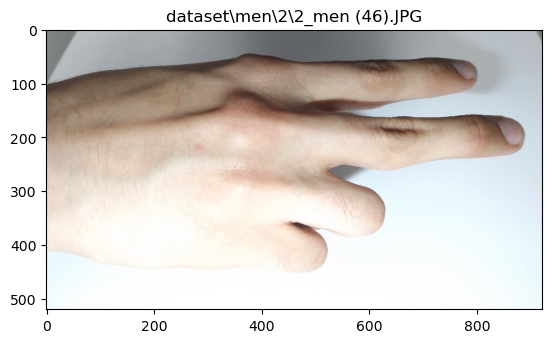

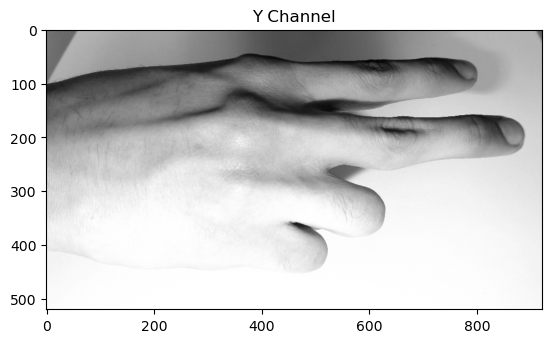

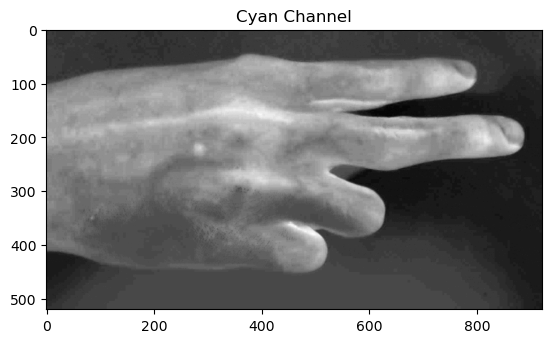

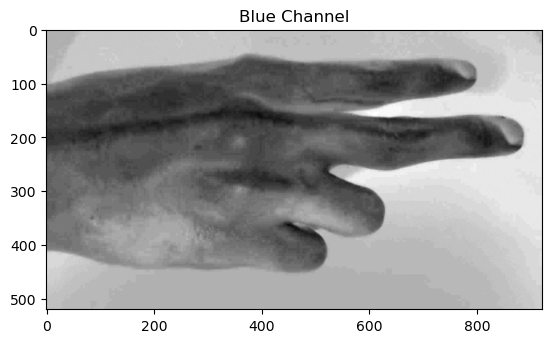

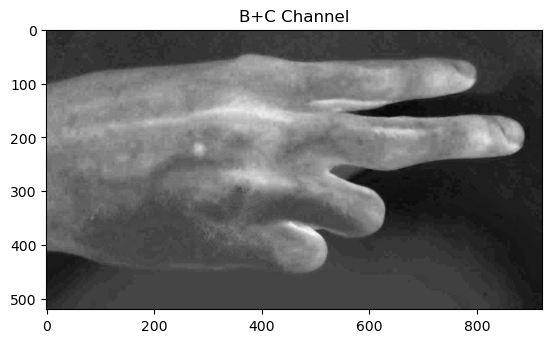

156 117


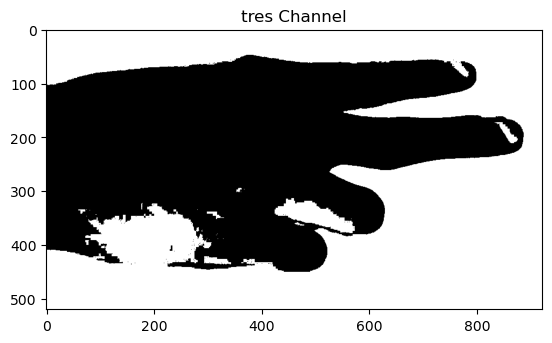

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

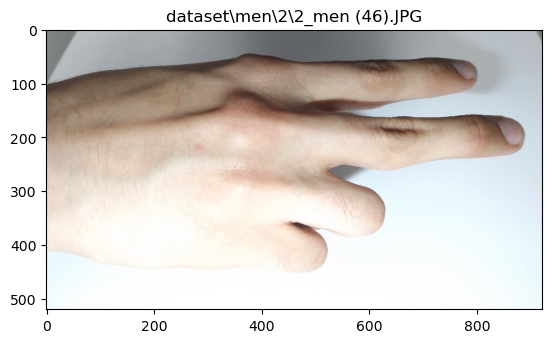

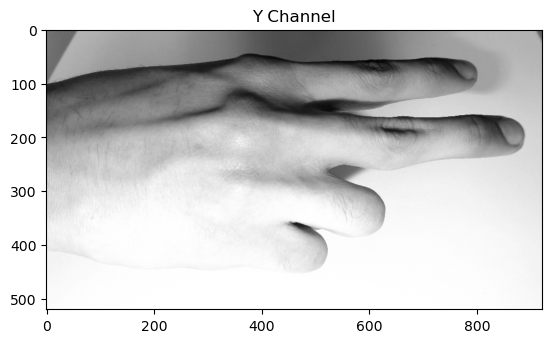

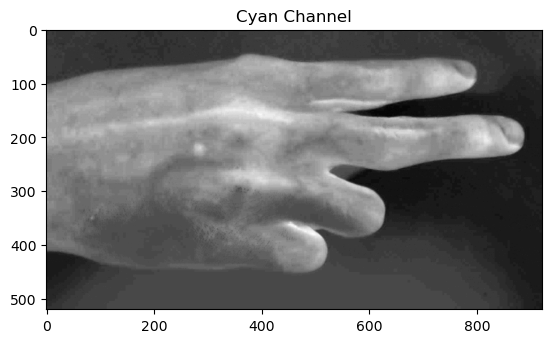

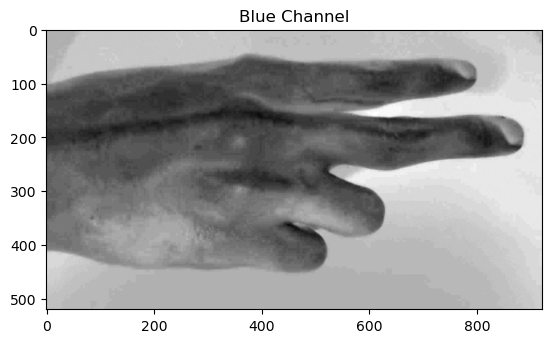

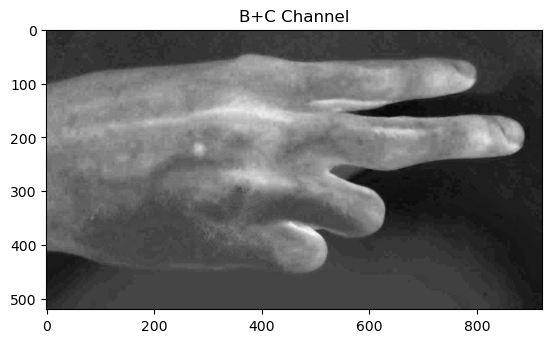

156 117


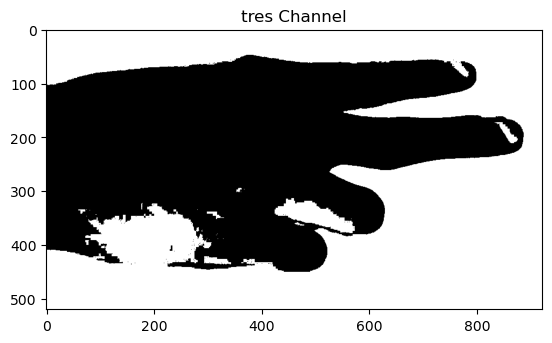

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

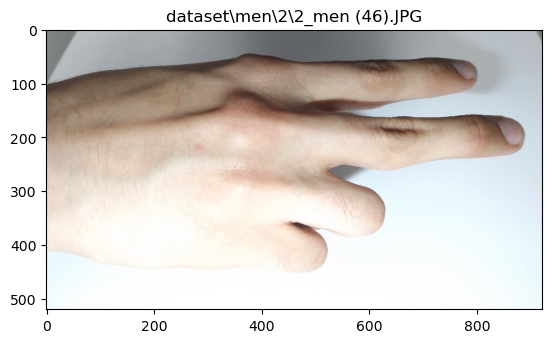

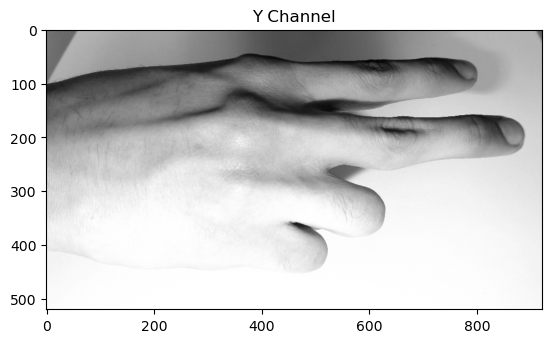

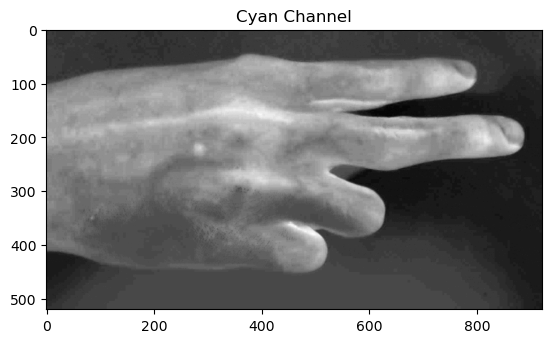

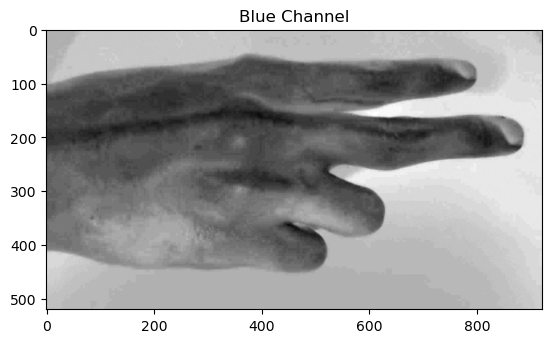

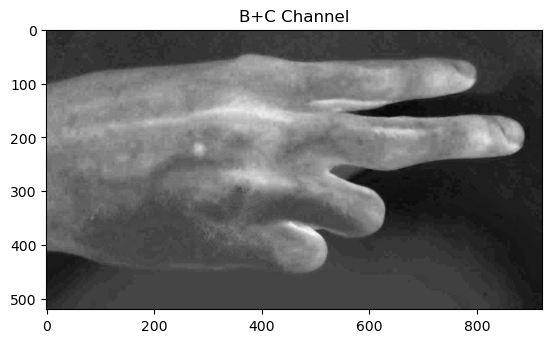

156 117


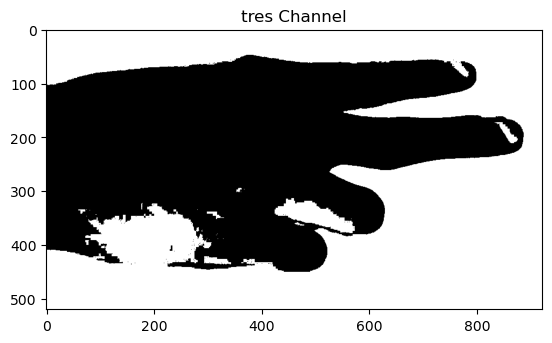

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

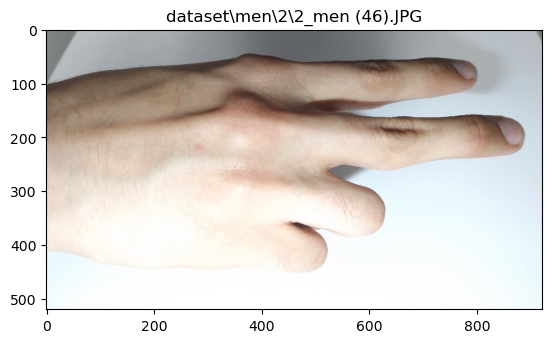

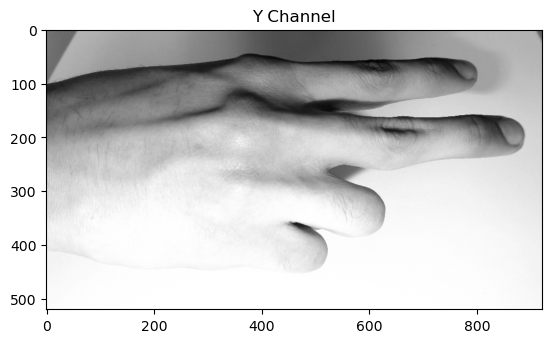

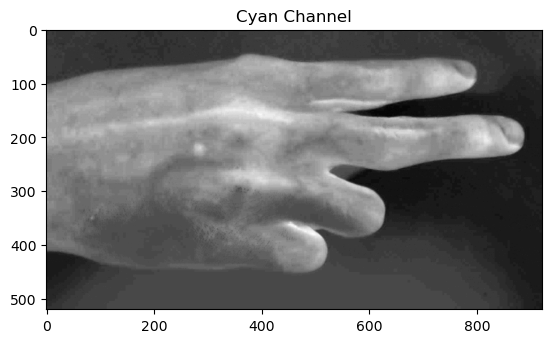

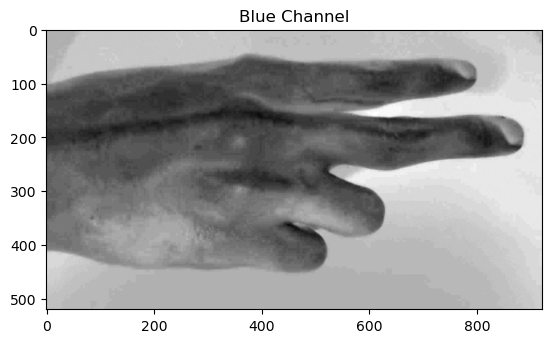

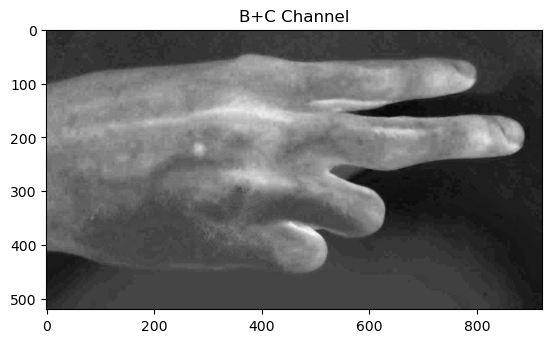

156 117


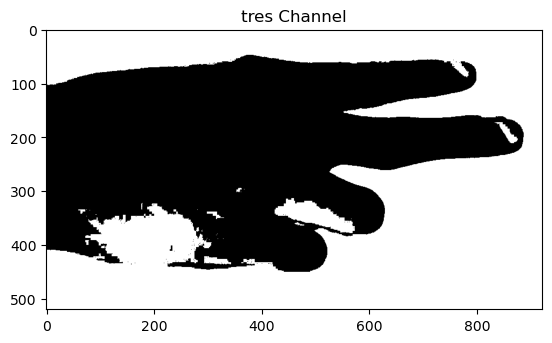

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

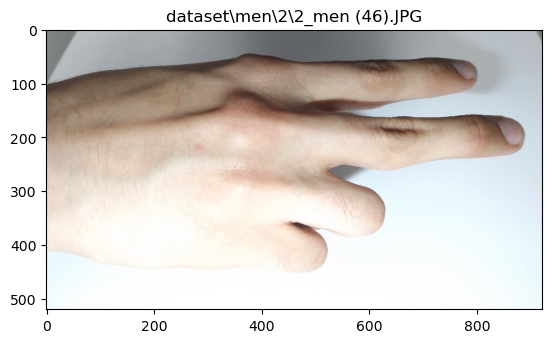

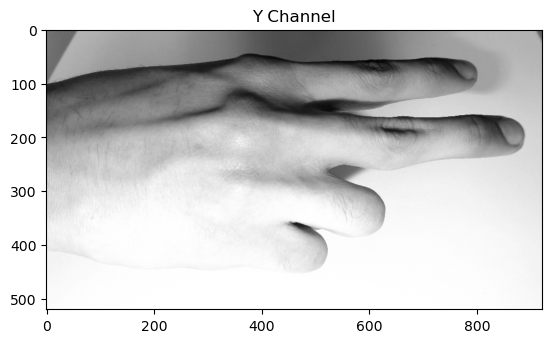

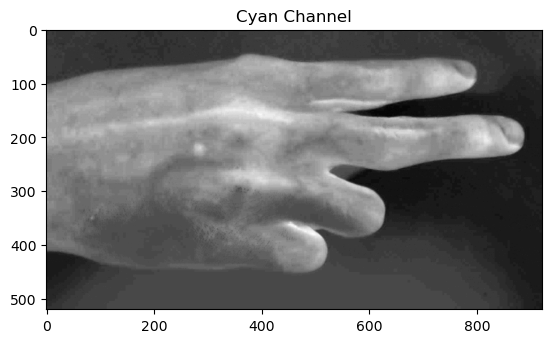

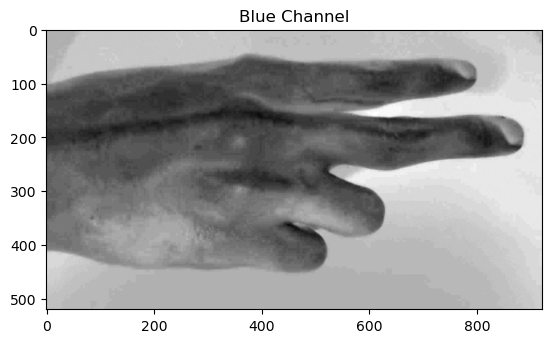

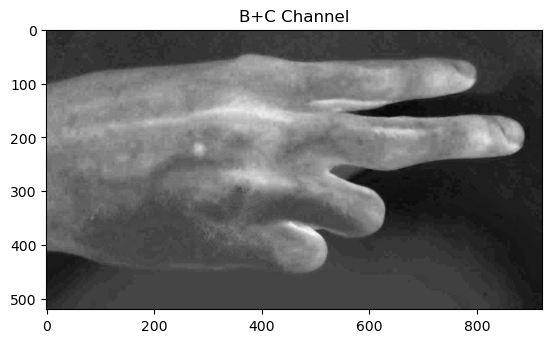

156 117


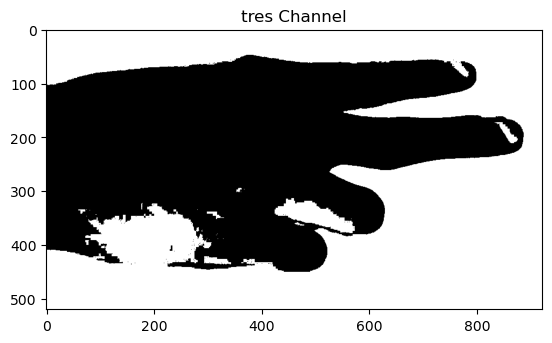

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

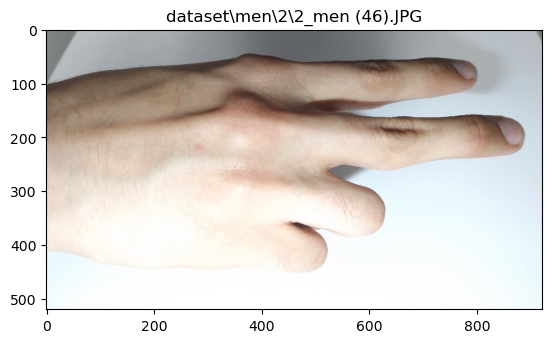

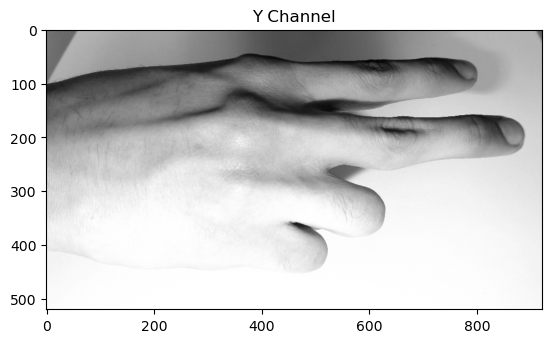

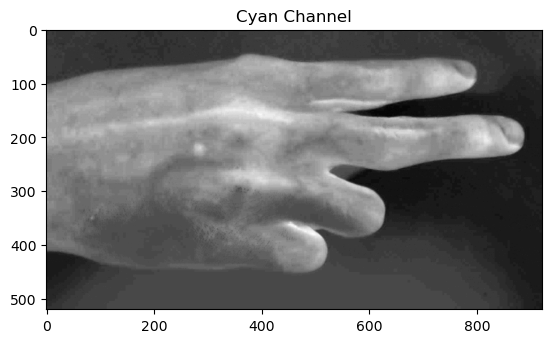

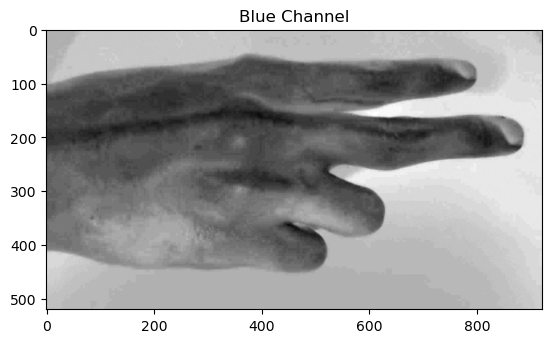

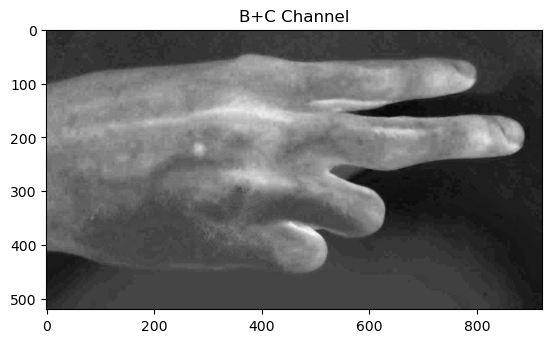

156 117


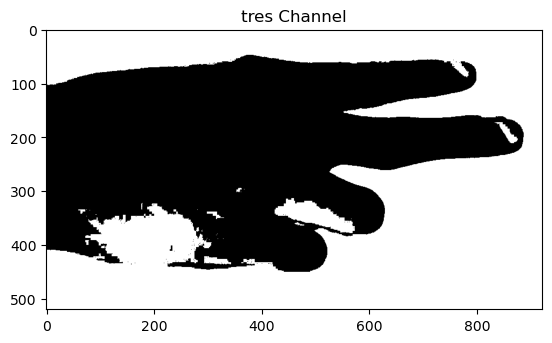

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

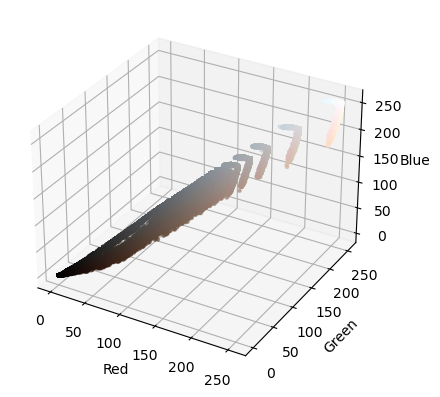

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
r, g, b = cv2.split(nemo)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

pixel_colors = nemo.reshape((np.shape(nemo)[0]*np.shape(nemo)[1], 3))
norm = colors.Normalize(vmin=-1., vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

axis.scatter(r.flatten(), g.flatten(), b.flatten(),
             facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
plt.show()

(256, 1)


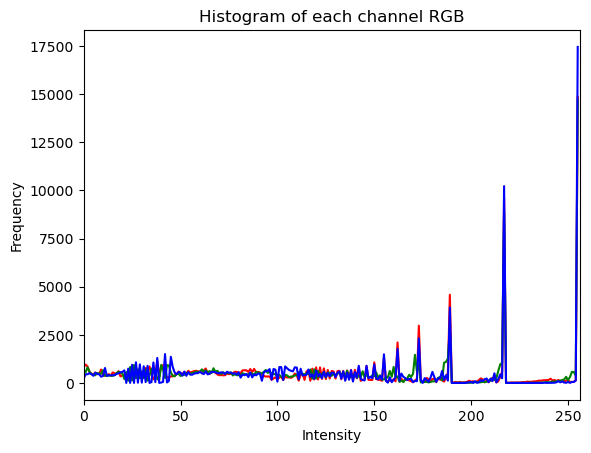

(256, 1)


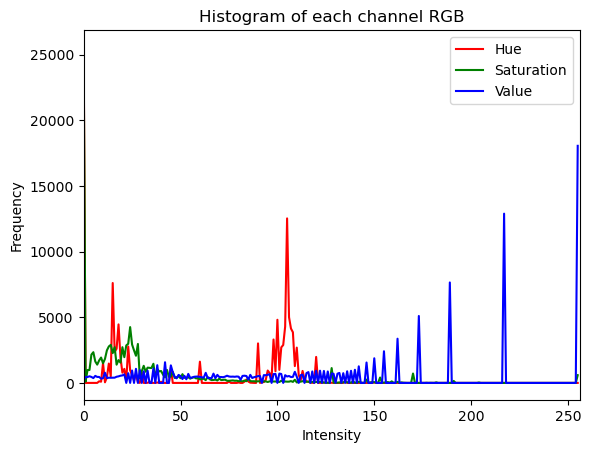

In [ ]:
# draw histogram of each channel in the image
import matplotlib.pyplot as plt
import cv2
color = ('b', 'g', 'r')

# Read the image
img2 = nemo
img2 = cv2.resize(img2, (461, 260))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# Split the image into its R, G and B channels
r, g, b = cv2.split(img2)

# Calculate the histogram of each channel using cv2.calcHist
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
print(hist_r.shape)
# Plot the histograms using matplotlib.pyplot
plt.figure()
plt.title('Histogram of each channel RGB')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.plot(hist_r, color='r')
plt.plot(hist_g, color='g')
plt.plot(hist_b, color='b')
plt.xlim([0, 256])
plt.show()


# NOW with HSV color space
img2 = cv2.cvtColor(img2, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(img2)
# Calculate the histogram of each channel using cv2.calcHist
hist_r = cv2.calcHist([h], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([v], [0], None, [256], [0, 256])
print(hist_r.shape)
# Plot the histograms using matplotlib.pyplot
plt.figure()
plt.title('Histogram of each channel RGB')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.plot(hist_r, color='r', label='Hue')
plt.plot(hist_g, color='g', label='Saturation')
plt.plot(hist_b, color='b', label='Value')
plt.xlim([0, 256])
plt.legend()
plt.show()

# draw each channel in the image

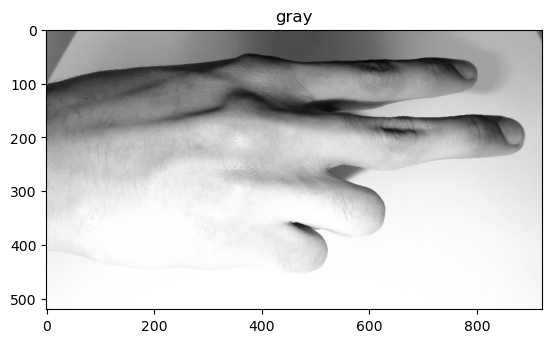

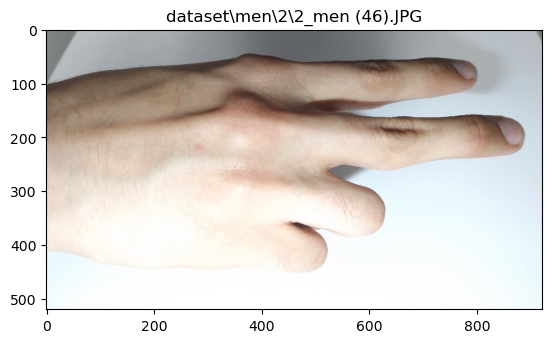

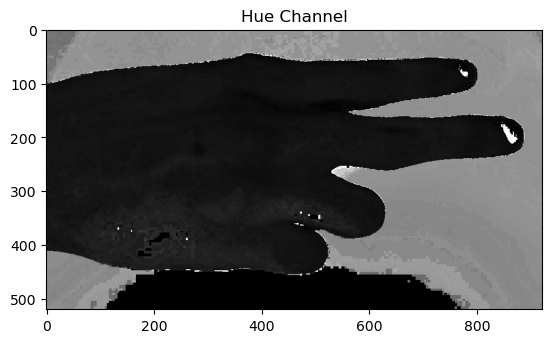

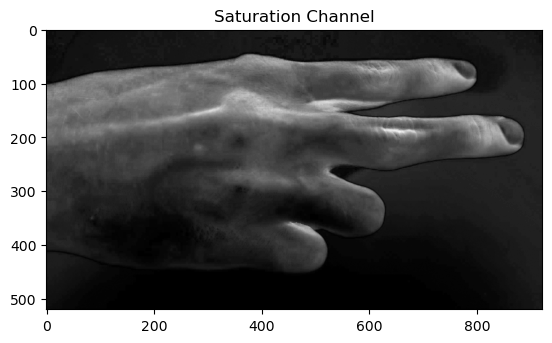

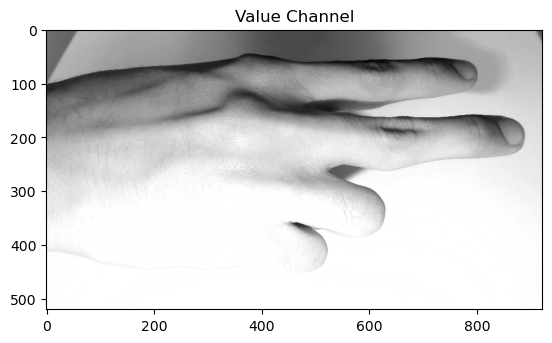

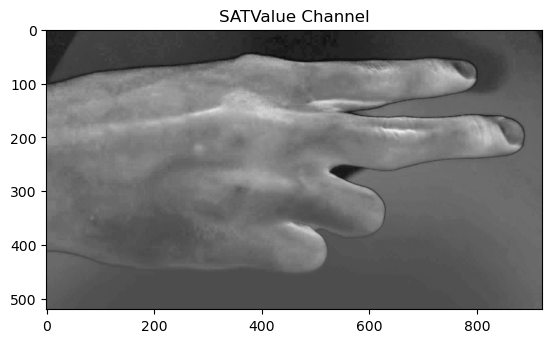

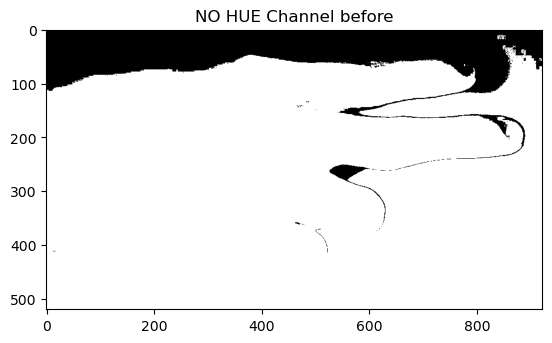

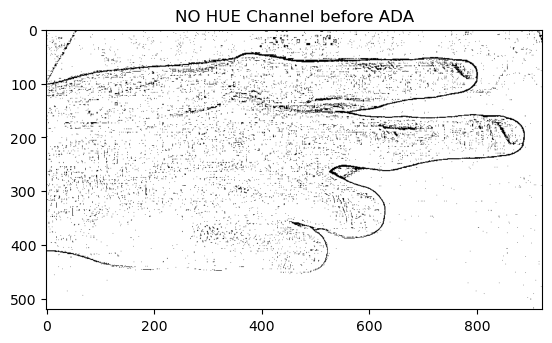

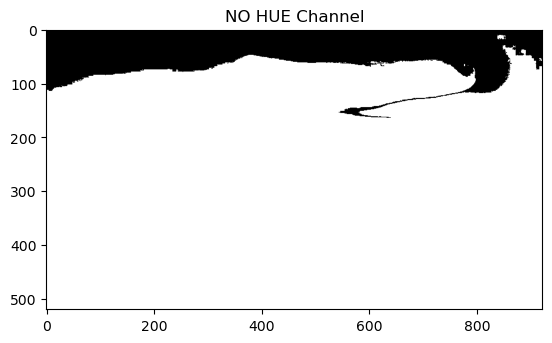

In [ ]:

import cv2
import numpy as np

# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt_t('gray', gray, cmap='gray')
    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    h_channel = np.zeros_like(h)
    s_channel = np.zeros_like(s)
    v_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            h_channel[i, j] = h[i, j]
            s_channel[i, j] = s[i, j]
            v_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Hue Channel', h_channel, cmap='gray')
    plt_t('Saturation Channel', s_channel, cmap='gray')
    plt_t('Value Channel', v_channel, cmap='gray')
    plt_t('SATValue Channel', 0.3 * v_channel + s_channel, cmap='gray')

    # set hue channel to 0
    h_channel = np.zeros_like(h)
    # merge the channels back together
    hsv_img = cv2.merge((h_channel, s_channel, v_channel))
    # tresholding on the saturation channel
    gray = cv2.cvtColor(hsv_img, cv2.COLOR_BGR2GRAY)
    # Convert BGR to HSV color space
    _, trr = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    ada = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    holesimg = ndi.binary_fill_holes(trr).astype(np.int8)
    plt_t('NO HUE Channel before', trr, cmap='gray')
    plt_t('NO HUE Channel before ADA', ada, cmap='gray')
    plt_t('NO HUE Channel', holesimg, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

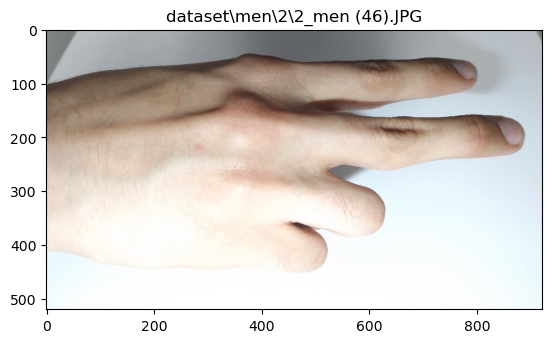

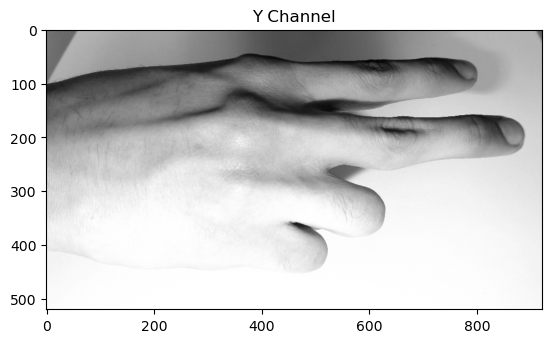

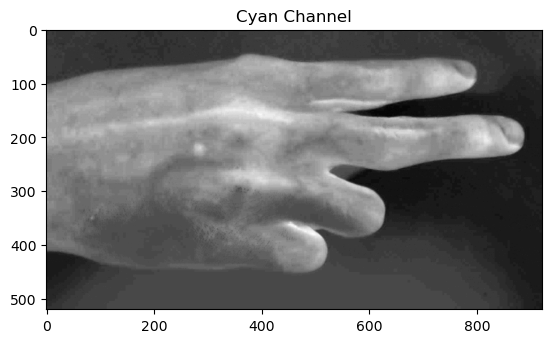

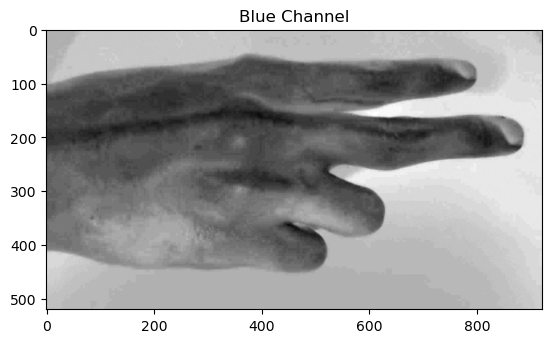

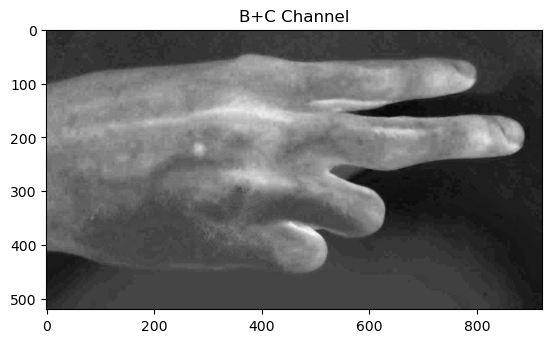

156 117


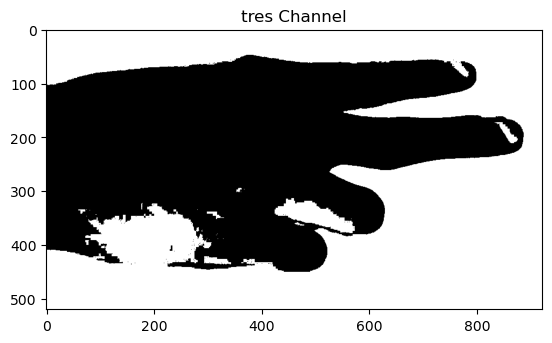

In [ ]:
import cv2
from skimage.filters import unsharp_mask
import numpy as np


def remove_shadow(name):
    # convert to gray
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # blur
    smooth = cv2.GaussianBlur(gray, (95, 95), 0)

    # divide gray by morphology image
    division = cv2.divide(gray, smooth, scale=255)

    # sharpen using unsharp masking
    sharp = unsharp_mask(division, radius=1.5, amount=1.5,
                         multichannel=False, preserve_range=False)
    sharp = (255*sharp).clip(0, 255).astype(np.uint8)

    # threshold
    thresh = cv2.threshold(
        sharp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # save results
    plt_t('receipt_division.png', division)
    plt_t('receipt_division_sharp.png', sharp)
    plt_t('receipt_division_thresh.png', thresh)


# Read in image
path = r'dataset\men\2\2_men (167).JPG'
path2 = r'dataset\men\2\2_men (130).JPG'

name = path2


def try_HSV(name):
    img = cv2.imread(name)
    img = cv2.resize(img, (461*2, 2*260))

    # Convert BGR to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)

    # Split HSV image into separate channels
    h, s, v = cv2.split(hsv_img)

    # Create blank images for each channel
    y_channel = np.zeros_like(h)
    C_channel = np.zeros_like(s)
    B_channel = np.zeros_like(v)

    # Loop through each pixel of the image and assign the corresponding Hue, Saturation, and Value values to the corresponding pixel in each channel
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            y_channel[i, j] = h[i, j]
            C_channel[i, j] = s[i, j]
            B_channel[i, j] = v[i, j]

    # Display the individual channels
    plt_t(name,  cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt_t('Y Channel', y_channel, cmap='gray')
    plt_t('Cyan Channel', C_channel, cmap='gray')
    plt_t('Blue Channel', B_channel, cmap='gray')
    plt_t('B+C Channel', 0.3 * B_channel + C_channel, cmap='gray')

    # tresholding on the saturation channel

    print(C_channel.max(), C_channel.min())
    # trr = cv2.adaptiveThreshold(B_channel, 1, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 51, 2)

    # Convert BGR to HSV color space
    _, trr2 = cv2.threshold(
        B_channel, 1, 1.0, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # plt_t('ada Channel', trr)
    plt_t('tres Channel', trr2, cmap='gray')


path3 = r'dataset\Women\5\5_woman (132).JPG'
path4 = r"dataset\men\2\2_men (30).JPG"
pat5 = r"D:\academic_material\third_year\sec_term\NN\project\dataset\men\5\5_men (49).JPG"
p5 = r"dataset\men\5\5_men (49).JPG"
p7 = r"dataset\men\2\2_men (46).JPG"
p6 = r"dataset\men\0\0_men (118).JPG"
try_HSV(p7)

# remove_shadow(p7)

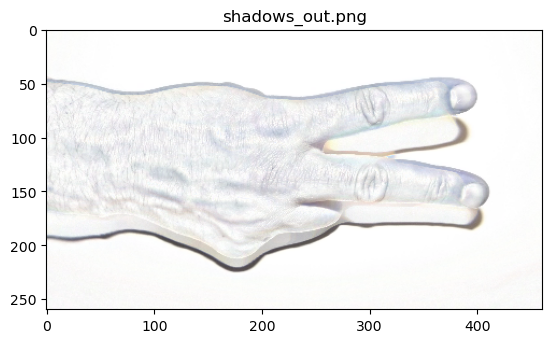

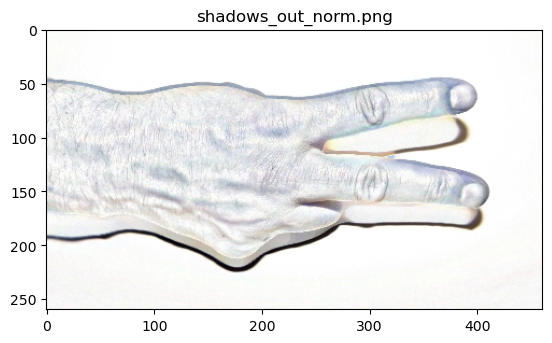

In [ ]:
import cv2
import numpy as np

img2 = cv2.imread(r'dataset\men\2\2_men (165).JPG', -1)
img2 = cv2.resize(img2, (461, 260))
rgb_planes = cv2.split(img2)

result_planes = []
result_norm_planes = []
for plane in rgb_planes:
    dilated_img = cv2.dilate(plane, np.ones((7, 7), np.uint8))
    bg_img = cv2.medianBlur(dilated_img, 21)
    diff_img = 255 - cv2.absdiff(plane, bg_img)
    norm_img = cv2.normalize(
        diff_img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    result_planes.append(diff_img)
    result_norm_planes.append(norm_img)

result = cv2.merge(result_planes)
result_norm = cv2.merge(result_norm_planes)

plt_t('shadows_out.png', result)
plt_t('shadows_out_norm.png', result_norm)
plt.show()

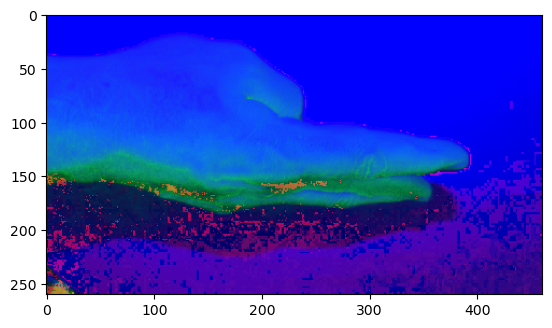

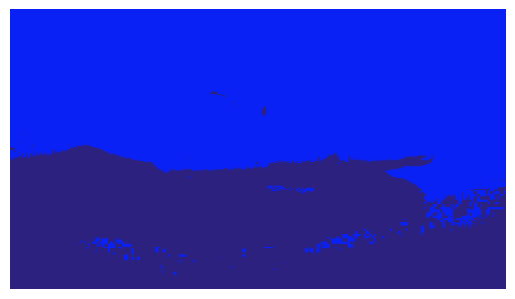

In [ ]:
img2 = cv2.imread(r'dataset\men\2\2_men (167).JPG', -1)
img2 = cv2.resize(img2, (461, 260))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2HSV)
plt.imshow(img2)
plt.show()
twoDimage = img2.reshape((-1, 3))
twoDimage = np.float32(twoDimage)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 2
attempts = 10

ret, label, center = cv2.kmeans(
    twoDimage, K, None, criteria, attempts, cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img2.shape))

plt.axis('off')
plt.imshow(result_image)
plt.show()

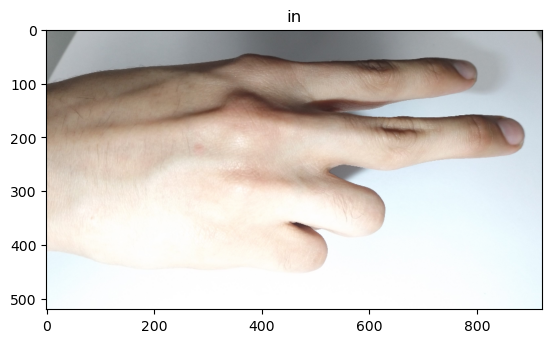

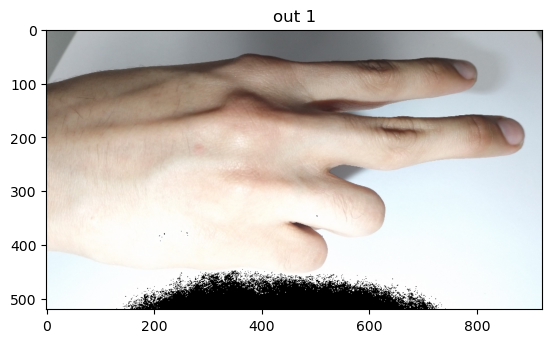

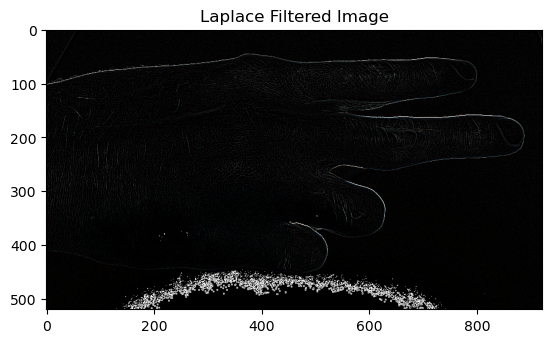

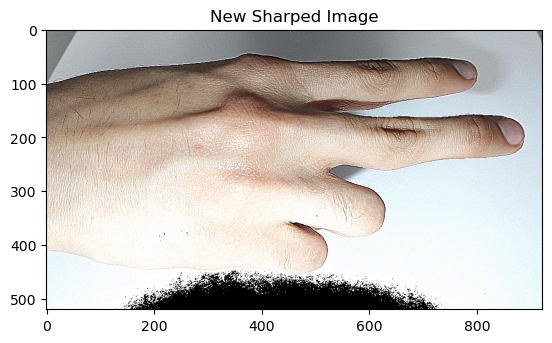

In [ ]:
# https://docs.opencv.org/4.x/d2/dbd/tutorial_distance_transform.html
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
import random as rng
rng.seed(12345)


path = r'dataset\men\2\2_men (164).JPG'
path = p7
src = cv.imread(path)
src = cv.resize(src, (461*2, 260*2))
src = cv.cvtColor(src, cv.COLOR_BGR2RGB)
# Check if image is loaded fine

# Show source image
plt_t("in", src)
src[np.all(src == 255, axis=2)] = 0
# Show output image
plt_t("out 1", src)


# -------------------------------------------

kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]], dtype=np.float32)
# do the laplacian filtering as it is
# well, we need to convert everything in something more deeper then CV_8U
# because the kernel has some negative values,
# and we can expect in general to have a Laplacian image with negative values
# BUT a 8bits unsigned int (the one we are working with) can contain values from 0 to 255
# so the possible negative number will be truncated
imgLaplacian = cv.filter2D(src, cv.CV_32F, kernel)
sharp = np.float32(src)
imgResult = sharp - imgLaplacian
# convert back to 8bits gray scale
imgResult = np.clip(imgResult, 0, 255)
imgResult = imgResult.astype('uint8')
imgLaplacian = np.clip(imgLaplacian, 0, 255)
imgLaplacian = np.uint8(imgLaplacian)

plt_t('Laplace Filtered Image', imgLaplacian)
plt_t('New Sharped Image', imgResult)

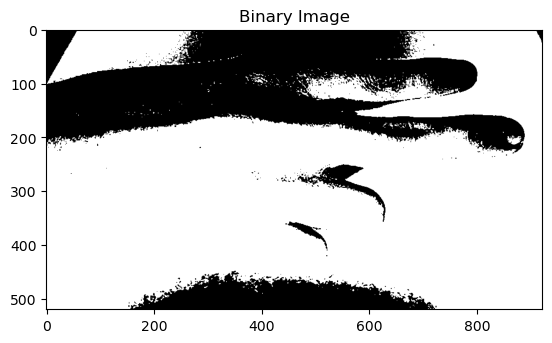

In [ ]:
bw = cv.cvtColor(imgResult, cv.COLOR_BGR2GRAY)
_, bw = cv.threshold(bw, 40, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
# median filter
bw = cv.medianBlur(bw, 3)
plt_t('Binary Image', bw, cmap='gray')

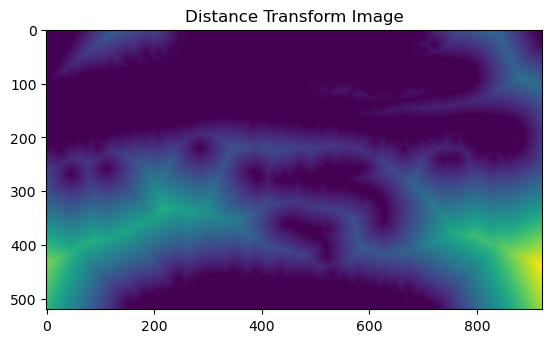

In [ ]:
dist = cv.distanceTransform(bw, cv.DIST_L2, 3)
# Normalize the distance image for range = {0.0, 1.0}
# so we can visualize and threshold it
cv.normalize(dist, dist, 0, 1.0, cv.NORM_MINMAX)
plt_t('Distance Transform Image', dist)

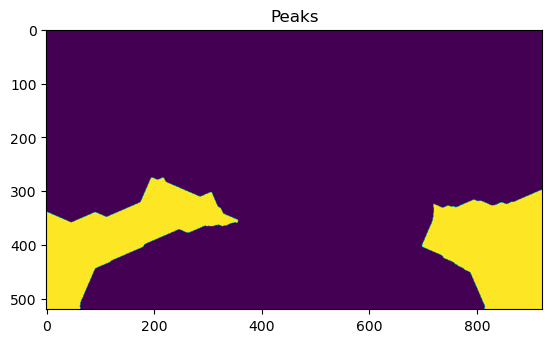

In [ ]:
_, dist = cv.threshold(dist, 0.4, 1.0, cv.THRESH_BINARY)
# Dilate a bit the dist image
kernel1 = np.ones((3, 3), dtype=np.uint8)
dist = cv.dilate(dist, kernel1)
plt_t('Peaks', dist)

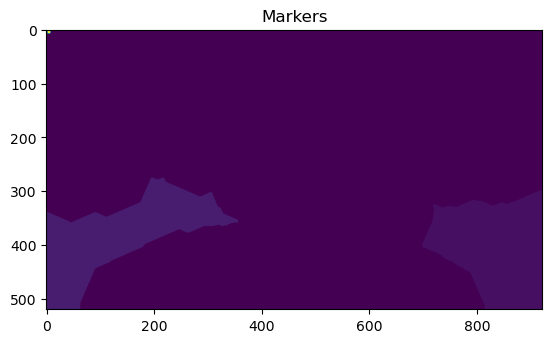

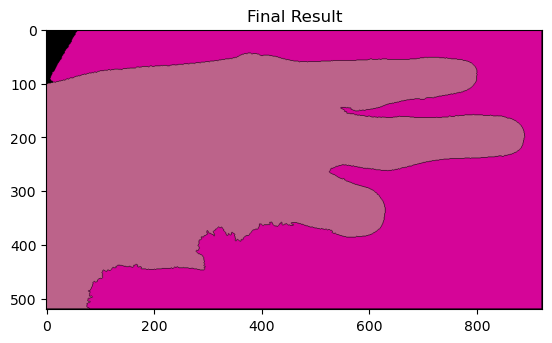

In [ ]:
dist_8u = dist.astype('uint8')
# Find total markers
contours, _ = cv.findContours(
    dist_8u, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
# Create the marker image for the watershed algorithm
markers = np.zeros(dist.shape, dtype=np.int32)
# Draw the foreground markers
for i in range(len(contours)):
    cv.drawContours(markers, contours, i, (i+1), -1)
# Draw the background marker
cv.circle(markers, (5, 5), 3, (255, 255, 255), -1)
markers_8u = (markers * 10).astype('uint8')
plt_t('Markers', markers_8u)
cv.watershed(imgResult, markers)
# mark = np.zeros(markers.shape, dtype=np.uint8)
mark = markers.astype('uint8')
mark = cv.bitwise_not(mark)
# uncomment this if you want to see how the mark
# image looks like at that point
# plt_t('Markers_v2', mark)
# Generate random colors
colors = []
for contour in contours:
    colors.append(
        (rng.randint(0, 256), rng.randint(0, 256), rng.randint(0, 256)))
# Create the result image
dst = np.zeros((markers.shape[0], markers.shape[1], 3), dtype=np.uint8)
# Fill labeled objects with random colors
for i in range(markers.shape[0]):
    for j in range(markers.shape[1]):
        index = markers[i, j]
        if index > 0 and index <= len(contours):
            dst[i, j, :] = colors[index-1]
# Visualize the final image
plt_t('Final Result', dst)

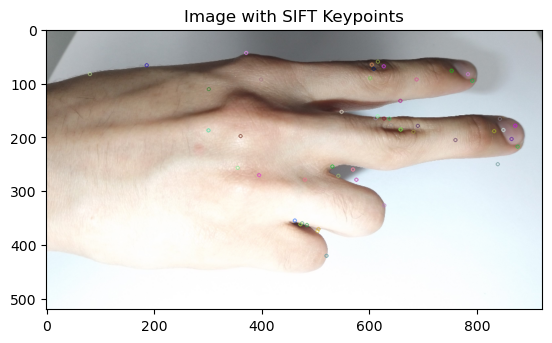

In [ ]:
import cv2
import numpy as np

# Read in image
img = cv2.imread(p7)
img = cv2.resize(img, (461*2, 260*2))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Convert image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
kp, des = sift.detectAndCompute(gray, None)

# Draw keypoints on the original image
img_with_keypoints = cv2.drawKeypoints(img, kp, None)

# Display the image with keypoints
plt_t('Image with SIFT Keypoints', img_with_keypoints)


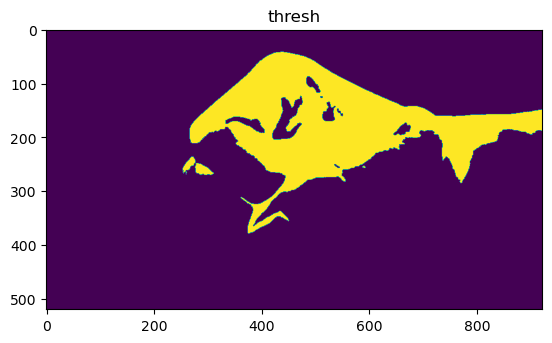

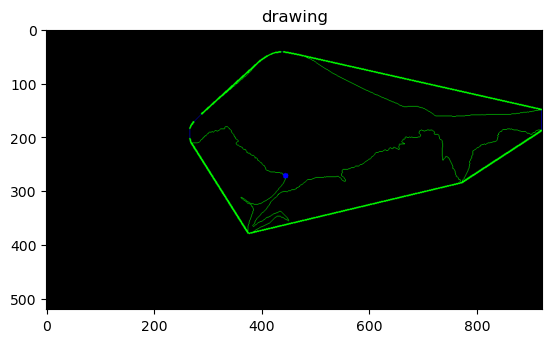

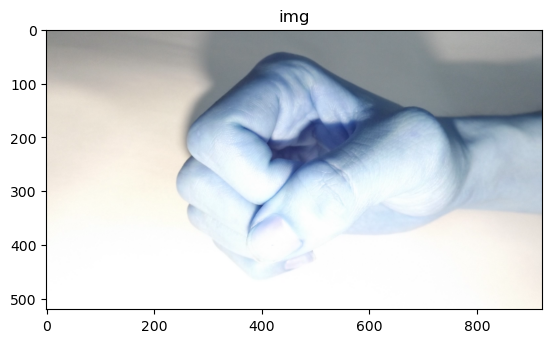

In [ ]:
# finding contour with max area
import math
img = cv2.imread(p6)
img = cv2.resize(img, (461*2, 260*2))
    
def imageFiltering(frame):
    # area of intereset(hand)

    # applying gaussian blurr to reduce the noise
    blur = cv2.GaussianBlur(frame, (5, 5), 0)
    # converting from coloured to HSV
    hsv = cv2.cvtColor(blur, cv2.COLOR_BGR2HSV)

    # applying a mask which makes skin color white and others black
    mask = cv2.inRange(hsv, np.array([2, 50, 50]), np.array([20, 255, 255]))

    kernel = np.ones((5, 5))
    # reducing noise
    filtered = cv2.GaussianBlur(mask, (3, 3), 0)
    ret, thresh = cv2.threshold(filtered, 127, 255, 0)  # thesholding the image
    thesh = cv2.GaussianBlur(thresh, (5, 5), 0)  # reducing the noise
    # finding contours in the image. Will be used later in complex hull algorithm
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    return frame, thresh, contours

roi, thresh, contours = imageFiltering(img)  # getting the filtered image

    # blank image which will be used to show the contours and defects
drawing = np.zeros(roi.shape, np.uint8)

contour = max(contours, key=lambda x: cv2.contourArea(x), default=0)

# convex hull. This creates a convex polygon.
hull = cv2.convexHull(contour)

# draw contours
cv2.drawContours(drawing, [contour], -1, (0, 255, 0), 0)
cv2.drawContours(drawing, [hull], -1, (0, 0, 255), 0)

# finding defects in the convex polygon formed using convex hull algorithm
hull = cv2.convexHull(contour, returnPoints=False)
defects = cv2.convexityDefects(contour, hull)

count_defects = 0  # defaults initially set to 0

# finding defects and displaying them on the image
for i in range(defects.shape[0]):
    s, e, f, d = defects[i, 0]  # defect returns 4 arguments
    # using start, end, far to find the defects location
    start = tuple(contour[s][0])
    end = tuple(contour[e][0])
    far = tuple(contour[f][0])

    # finding the angle of the defect using cosine law
    a = math.sqrt((end[0] - start[0]) ** 2 + (end[1] - start[1]) ** 2)
    b = math.sqrt((far[0] - start[0]) ** 2 + (far[1] - start[1]) ** 2)
    c = math.sqrt((end[0] - far[0]) ** 2 + (end[1] - far[1]) ** 2)
    angle = (math.acos((b ** 2 + c ** 2 - a ** 2) / (2 * b * c)) * 180) / 3.14

    # we know, angle between 2 fingers is within 90 degrees.
    # so anything greater than that isn;t considered
    if angle <= 90:
        count_defects += 1
        cv2.circle(drawing, far, 5, [0, 0, 255], -1)  # displaying defect

    cv2.line(drawing, start, end, [0, 255, 0], 2)
    
plt_t("thresh", thresh)
plt_t("drawing", drawing)
plt_t("img", img)